<a href="https://colab.research.google.com/github/envirodatascience/final-project-hydro-team/blob/main/Project_617_April_2025_Hydro_Team.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Comparative Analysis of Hydropower Projects in the US, India and Global Perspective
---
*Author: Hydro Team (April 2025) - Ranjit Kumar, Umer Vaqar  
Yale School of the Environment - ENV 617 Final Project*

---

## Table of Contents

1. Introduction
2. Load and Preview the Data
    - 2.1 United States Hydropower Dataset
    - 2.2 India Hydropower Dataset
    - 2.3 Global Hydropower Dataset
3. Data Cleaning and Preparation
    - 3.1 United States: Cleaning and Preparation
    - 3.2 India: Cleaning and Preparation
    - 3.3 Global: Cleaning and Preparation
4. Exploratory Data Analysis (EDA)
    - 4.1 United States: Summary Statistics
    - 4.2 India: Summary Statistics
    - 4.3 Global: Summary Statistics
5. Research Question 1: Comparative Analysis of Hydropower Designs
    - 5.1 Comparing Physical Dimensions: US vs India vs Global
6. Research Question 2: Correlation Between Design Features and Energy Generation
    - 6.1 United States: Design vs Capacity
    - 6.2 India: Design vs Capacity
    - 6.3 Global: Design vs Capacity
7. Research Question 3: Temporal and Operational Trends
    - 7.1 Evolution of Project Characteristics by Commissioning Year
8. Research Question 4: Influence of Administrative and Organizational Factors
    - 8.1 Ownership and Administrative Analysis (US, India, Global)
9. Mapping Hydropower Projects
    - 9.1 United States
    - 9.2 India
    - 9.3 Global Highlights (where coordinate data available)
10. Conclusion and Future Directions

---

# Section Descriptions

**1. Introduction**

Context: U.S., India, and global hydropower projects.
Overview of project goals based on research questions.

**2. Load and Preview the Data**

Read in all three datasets.
.head(), .info(), .describe() for quick familiarity.

**3. Data Cleaning and Preparation**

Separate cleaning steps because datasets have different formats.
Standardize important columns across datasets.
Check for missing values, duplicates, and inconsistencies.

**4. Exploratory Data Analysis (EDA)**

Summary stats for size, height, reservoir area, capacity.
Histograms, boxplots, and basic distributions.

**5. Research Question 1:**
- Comparative Analysis of Hydropower Designs

- Compare key physical attributes across US, India, and Global datasets.
Statistical comparisons if meaningful (e.g., means, medians).

**6. Research Question 2:**

- Correlation Between Design Features and Energy Generation

- Check relationships (scatterplots, correlation coefficients).

**7. Research Question 3:**
- Temporal and Operational Trends

- Analyze how designs evolved by decade (1910s, 1920s, etc.)
Track changes in capacity and storage over time.

**8. Research Question 4:**
- Influence of Administrative and Organizational Factors

- Compare project ownership (Govt vs Private) and outcomes (capacity, operation status).

**9. Mapping Hydropower Projects**

- Plot latitude/longitude for each dataset (if available and meaningful).

**10. Conclusion and Future Directions**

- Summarize findings and propose next steps.

# 1. **Introduction**

Hydropower is a critical component of renewable energy systems worldwide, providing reliable electricity generation while interacting closely with water resources management. In this project, we conduct a comparative analysis of hydropower projects across three datasets:

- United States Hydropower Projects
- Indian Hydropower Projects
- Global Hydropower Dataset

Our aim is to investigate key differences in physical design, explore relationships between design parameters and generation capacity, analyze temporal development trends, and understand how administrative or organizational factors influence project outcomes. By grounding our analysis in real-world datasets, we seek to generate insights into how hydropower practices vary across regions and how these differences may inform future project design and energy planning.

This analysis is structured to answer four core research questions and provide a global context for understanding hydropower development patterns.

Below we will Import Packages:

In [ ]:
1. # Import Packages
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from plotnine import *
import plotnine
from mizani.formatters import scientific_format, percent_format, currency_format
import folium
from folium.plugins import MarkerCluster

# Set plot size defaults for plotnine
plotnine.options.figure_size = (10,6)

**Load Hydropower Datasets**

In this section, we load three hydropower datasets:

- United States projects
India projects
Global hydropower plants
These datasets come from publicly available sources and represent dam/project-level information. We use direct GitHub links to ensure reproducibility.

In [ ]:
2. # Load Hydropower Datasets

# Load US Hydropower Data
link_us = "https://raw.githubusercontent.com/youveena/FInal-Project/main/hydropower.csv"
df_us = pd.read_csv(link_us, low_memory=False)

# Load India Hydropower Data
link_india = "https://raw.githubusercontent.com/youveena/FInal-Project/main/iha_hydrodatabase_240919_csv.csv"
df_india = pd.read_csv(link_india, low_memory=False)

# Load Global Power Plant Data
link_global = "https://raw.githubusercontent.com/youveena/FInal-Project/main/global_power_plant_database.csv"
df_global = pd.read_csv(link_global, low_memory=False)

**Preview and Orient to Hydropower Datasets**

- Before cleaning or analyzing, it’s critical to orient ourselves to each dataset:

- Understand key variables and data types
Identify missing values
Get a sense of dataset size and structure
We will use .head(), .info(), and .describe() to do a quick review for each dataset.

In [ ]:
2 # Preview US Hydropower Data
print("----- US Hydropower Data Overview -----")
display(df_us.head())
print("\n")
print(df_us.info())
print("\n")
display(df_us.describe())

----- US Hydropower Data Overview -----


,Dimensions.Crest Elevation,Dimensions.Crest Length,Dimensions.Structural Height,Identity.Name,Identity.Watercourse,Location.County,Location.Latitude,Location.Longitude,Location.State,Identity.Project.Organization,Identity.Project.Year
0,1520.0,3800.00,86.00,Agate Dam,Dry Creek,Jackson,42.415500,-122.772300,Oregon,Rogue River Basin,1965
1,3348.0,1850.00,110.00,Agency Valley Dam,North Fork of the Malheur River,Malheur,43.911745,-118.154354,Oregon,Vale,1934
2,5510.0,76300.00,265.00,Alcova Dam,North Platte River,Natrona,42.548300,-106.719400,Wyoming,Kendrick,1935
3,2172.5,2784.18,132.17,Almena Diversion Dam,Prairie Dog Creek,Norton,39.766670,-100.100410,Kansas,PSMBP - Almena,1967
4,1564.0,1104.00,110.00,Altus Dam,"North Fork, Red River",Greer/Kiowa,34.883300,-99.300000,Oklahoma,W. C. Austin,1941




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 336 entries, 0 to 335
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Dimensions.Crest Elevation     336 non-null    float64
 1   Dimensions.Crest Length        336 non-null    float64
 2   Dimensions.Structural Height   336 non-null    float64
 3   Identity.Name                  336 non-null    object 
 4   Identity.Watercourse           336 non-null    object 
 5   Location.County                336 non-null    object 
 6   Location.Latitude              336 non-null    float64
 7   Location.Longitude             336 non-null    float64
 8   Location.State                 336 non-null    object 
 9   Identity.Project.Organization  336 non-null    object 
 10  Identity.Project.Year          336 non-null    int64  
dtypes: float64(5), int64(1), object(5)
memory usage: 29.0+ KB
None




,Dimensions.Crest Elevation,Dimensions.Crest Length,Dimensions.Structural Height,Location.Latitude,Location.Longitude,Identity.Project.Year
count,336.000000,336.000000,336.000000,336.000000,336.000000,336.000000
mean,4325.973423,3007.906131,140.035446,40.488927,-108.819077,1878.196429
std,3462.039739,6984.792345,119.235585,4.181310,7.699084,349.318163
min,72.000000,20.000000,6.000000,28.312500,-123.199650,0.000000
25%,2216.750000,674.750000,53.750000,36.768210,-114.466900,1924.000000
50%,4141.100000,1370.000000,129.500000,40.363750,-107.937949,1946.500000
75%,5706.750000,2784.180000,175.000000,43.595337,-103.590895,1961.000000
max,46255.000000,76665.000000,726.400000,48.852100,-95.915100,1988.000000


In [ ]:
# Preview India Hydropower Data
print("----- India Hydropower Data Overview -----")
display(df_india.head())
print("\n")
print(df_india.info())
print("\n")
display(df_india.describe())

----- India Hydropower Data Overview -----


,Hydropower Station Name,Database Status,ID,Country,ISO,Reservoir Name,Lake Name,Purpose,Admin_unit,Owner,...,Reference 3,Reference 4,Reference 5,Reference 6,Reference 7,Reference 8,Reference 9,Reference 10,Comment,Column1
0,Kalpong,Matched with hydro station,179,India,IND,NaN,NaN,Hydropower,Andaman & Nicobar,A&N Administration,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Nagarjuna Sagar,Matched with hydro station,28,India,IND,Nagarjuna Sagar,NaN,"Multi-purpose Irrigation, Hydropower",Andhra Pradesh,APGENCO,...,https://upload.wikimedia.org/wikipedia/commons...,https://www.thehindu.com/news/national/andhra-...,http://globalenergyobservatory.org/geoid/4428,https://apgenco.gov.in/getInfo.do,http://nwda.gov.in/upload/uploadfiles/files/92...,https://telanganatoday.com/crisis-stares-at-fa...,http://globalenergyobservatory.org/geoid/4427,http://globalenergyobservatory.org/geoid/4426,The reservoir is located between the borders ...,NaN
2,Penna Ahobilam,Matched with hydro station,29,India,IND,Dr KS Penna Ahobilam Balancing Reservoir,NaN,"Irrigation, Hydropower",Andhra Pradesh,APGENCO,...,https://apgenco.gov.in/getInfo.do,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Also called PABR Dam. The Penna Ahobilam Power...,NaN
3,Srisailam,Matched with hydro station,156,India,IND,Srisailam,NaN,Hydropower,Andhra Pradesh,TSGENCO & APGENCO,...,https://web.archive.org/web/20110721165130/htt...,http://www.contec.co.in/project/single_whole_p...,https://www.indiawaterportal.org/articles/mana...,http://iwm.vassarlabs.com/reservoir/Summary/AL...,https://irrigationap.cgg.gov.in/wrd/static/app...,https://www.scribd.com/document/58789365/Srisa...,https://www.tsgenco.co.in/getInfo.do,NaN,The second largest working hydroelectric stati...,NaN
4,Lower Subansiri,Under construction / stalled,182,India,IND,NaN,NaN,Hydropower,Assam/Arunachal Pradesh,National Hydroelectric Power Corporation (NHPC),...,http://web.iitd.ac.in/~arunku/files/CVL100/eia...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,The Subansiri Lower HE Project is the biggest ...,NaN




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 182 entries, 0 to 181
Data columns (total 50 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Hydropower Station Name      182 non-null    object 
 1   Database Status              182 non-null    object 
 2   ID                           182 non-null    int64  
 3   Country                      182 non-null    object 
 4   ISO                          182 non-null    object 
 5   Reservoir Name               72 non-null     object 
 6   Lake Name                    9 non-null      object 
 7   Purpose                      182 non-null    object 
 8   Admin_unit                   181 non-null    object 
 9   Owner                        128 non-null    object 
 10  Near_city                    180 non-null    object 
 11  District                     44 non-null     object 
 12  River                        182 non-null    object 
 13  Main_basin        

,ID,DamComplete,Dam_hgt,WaterHeadhgt( max),WaterHeadHgt (min),Res_capacityMm3,Transm_length,Transm_planned,Ann_firm_gen,Ann_tot_gen,Lat (reservoir/dam),Long (reservoir/dam),Lat (hydropower station 1),Long (hydropower station 1),Lat (hydropower station 2),Long (hydropower station 2)
count,182.000000,120.000000,181.000000,13.000000,12.000000,175.000000,10.000000,6.000000,0.0,74.000000,152.000000,152.000000,93.000000,93.000000,11.000000,11.000000
mean,91.500000,1978.216667,60.684254,337.915077,257.323333,1160.115017,488.946000,256.833333,NaN,1093.744054,18.562887,77.710339,19.031701,77.882304,22.196591,78.685670
std,52.683014,17.574898,47.505548,315.764810,259.751380,2349.260995,1134.669862,170.200372,NaN,1337.454951,7.261087,4.298868,7.312376,4.307481,8.081411,5.129734
min,1.000000,1923.000000,11.790000,31.000000,18.300000,0.072000,1.000000,11.000000,NaN,50.000000,8.522037,73.058815,8.503907,73.057452,10.355506,74.181031
25%,46.250000,1965.000000,30.500000,95.100000,56.310000,10.330000,9.410000,137.500000,NaN,236.250000,11.390183,74.927622,11.797476,75.369566,16.214030,75.911020
50%,91.500000,1978.000000,48.680000,140.210000,112.470000,150.000000,79.910000,310.000000,NaN,483.000000,18.188306,76.838588,18.454609,76.859818,21.353235,76.880251
75%,136.750000,1989.250000,67.860000,619.000000,482.715000,1065.000000,363.250000,400.000000,NaN,1479.460000,23.350197,78.103930,23.681450,78.372138,28.641694,79.108672
max,182.000000,2017.000000,365.000000,979.150000,712.000000,12220.000000,3680.000000,400.000000,NaN,7421.000000,34.144180,94.258600,34.144180,92.961092,34.140827,91.819315


In [ ]:
# Preview Global Hydropower Data
print("----- Global Hydropower Data Overview -----")
display(df_global.head())
print("\n")
print(df_global.info())
print("\n")
display(df_global.describe())

----- Global Hydropower Data Overview -----


,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,estimated_generation_gwh_2013,estimated_generation_gwh_2014,estimated_generation_gwh_2015,estimated_generation_gwh_2016,estimated_generation_gwh_2017,estimated_generation_note_2013,estimated_generation_note_2014,estimated_generation_note_2015,estimated_generation_note_2016,estimated_generation_note_2017
0,AFG,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.0,32.322,65.1190,Hydro,NaN,NaN,...,123.77,162.90,97.39,137.76,119.50,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
1,AFG,Afghanistan,Kandahar DOG,WKS0070144,10.0,31.670,65.7950,Solar,NaN,NaN,...,18.43,17.48,18.25,17.70,18.29,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
2,AFG,Afghanistan,Kandahar JOL,WKS0071196,10.0,31.623,65.7920,Solar,NaN,NaN,...,18.64,17.58,19.10,17.62,18.72,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.0,34.556,69.4787,Hydro,NaN,NaN,...,225.06,203.55,146.90,230.18,174.91,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.0,34.641,69.7170,Hydro,NaN,NaN,...,406.16,357.22,270.99,395.38,350.80,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34936 entries, 0 to 34935
Data columns (total 36 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   country                         34936 non-null  object 
 1   country_long                    34936 non-null  object 
 2   name                            34936 non-null  object 
 3   gppd_idnr                       34936 non-null  object 
 4   capacity_mw                     34936 non-null  float64
 5   latitude                        34936 non-null  float64
 6   longitude                       34936 non-null  float64
 7   primary_fuel                    34936 non-null  object 
 8   other_fuel1                     1944 non-null   object 
 9   other_fuel2                     276 non-null    object 
 10  other_fuel3                     92 non-null     object 
 11  commissioning_year              17447 non-null  float64
 12  owner                         

,capacity_mw,latitude,longitude,commissioning_year,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,estimated_generation_gwh_2013,estimated_generation_gwh_2014,estimated_generation_gwh_2015,estimated_generation_gwh_2016,estimated_generation_gwh_2017
count,34936.000000,34936.000000,34936.000000,17447.000000,14887.000000,6417.000000,7226.000000,8203.000000,9144.000000,9500.000000,9637.000000,9659.000000,16120.000000,16503.000000,17050.000000,17570.000000,33138.000000
mean,163.355148,32.816637,-6.972803,1997.414823,2018.218849,592.696107,656.863891,762.368840,693.149763,661.834161,517.320785,423.922436,239.112221,242.431122,235.866067,235.695265,716.443378
std,489.636072,22.638603,78.405850,23.397835,1.606428,2174.833482,2231.464288,2533.459828,2404.516759,2369.296957,1975.302686,1698.506485,1191.258172,1285.798297,1267.005223,1259.559841,2484.361200
min,1.000000,-77.847000,-179.977700,1896.000000,2000.000000,-947.600000,-989.619000,-864.428000,-768.620000,-934.944000,-982.622000,-780.339000,1.120000,0.870000,0.440000,0.300000,0.000000
25%,4.900000,29.256475,-77.641550,1988.000000,2017.000000,1.947000,2.260000,2.664500,2.729000,2.467000,2.242000,2.751500,8.620000,8.680000,8.380000,8.322500,8.180000
50%,16.745000,39.727750,-2.127100,2007.000000,2019.000000,23.426000,23.608500,26.142000,22.462389,17.876500,12.530000,11.530000,27.620000,28.250000,26.830000,27.555000,37.590000
75%,75.344250,46.263125,49.502675,2014.000000,2019.000000,199.706000,226.322250,285.862583,249.866750,214.505150,151.117000,122.781498,106.805000,106.980000,103.120000,107.237500,229.565000
max,22500.000000,71.292000,179.388700,2020.000000,2019.000000,50834.000000,32320.917000,37433.607000,32377.477000,36448.643000,35136.000000,31920.368000,48675.060000,58470.770000,57113.350000,60859.730000,82810.770000


**3. Data Cleaning and Preparation**

- Cleaning United States Hydropower Data

**Tasks for US data:**

Standardize column names (remove spaces if needed)
Handle missing values
Check and remove duplicates

In [ ]:
# Preview column names
df_us.columns

Index(['Dimensions.Crest Elevation', 'Dimensions.Crest Length',
       'Dimensions.Structural Height', 'Identity.Name', 'Identity.Watercourse',
       'Location.County', 'Location.Latitude', 'Location.Longitude',
       'Location.State', 'Identity.Project.Organization',
       'Identity.Project.Year'],
      dtype='object')

In [ ]:
# Rename columns for easier reference if needed
df_us = df_us.rename(columns={
    'Dimensions.Crest Elevation': 'crest_elevation_ft',
    'Dimensions.Crest Length': 'crest_length_ft',
    'Dimensions.Structural Height': 'structural_height_ft',
    'Identity.Name': 'project_name',
    'Identity.Watercourse': 'river',
    'Location.County': 'county',
    'Location.Latitude': 'latitude',
    'Location.Longitude': 'longitude',
    'Location.State': 'state',
    'Identity.Project.Organization': 'organization',
    'Identity.Project.Year': 'year_built'
})

# Check for missing values
df_us.isna().sum()

# Drop rows where important fields are missing (like project name or coordinates)
df_us = df_us.dropna(subset=['project_name', 'latitude', 'longitude'])

# Check for duplicates based on project_name
df_us.duplicated(subset=['project_name']).sum()

# Drop duplicate project names
df_us = df_us.drop_duplicates(subset=['project_name'])

# Quick check after cleaning
df_us.info()


<class 'pandas.core.frame.DataFrame'>
Index: 334 entries, 0 to 335
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   crest_elevation_ft    334 non-null    float64
 1   crest_length_ft       334 non-null    float64
 2   structural_height_ft  334 non-null    float64
 3   project_name          334 non-null    object 
 4   river                 334 non-null    object 
 5   county                334 non-null    object 
 6   latitude              334 non-null    float64
 7   longitude             334 non-null    float64
 8   state                 334 non-null    object 
 9   organization          334 non-null    object 
 10  year_built            334 non-null    int64  
dtypes: float64(5), int64(1), object(5)
memory usage: 31.3+ KB


**3. Cleaning India Hydropower Data**

In [ ]:
# Preview column names
df_india.columns

Index(['Hydropower Station Name', 'Database Status', 'ID', 'Country', 'ISO',
       'Reservoir Name', 'Lake Name', 'Purpose', 'Admin_unit', 'Owner ',
       'Near_city', 'District ', 'River', 'Main_basin', 'Catch_Area ',
       'Op_Status', 'Comissioned', 'DamComplete', 'No_Units', 'Dam_hgt ',
       'WaterHeadhgt( max)', 'WaterHeadHgt (min)', 'Res_capacityMm3',
       'Res_area km2', 'HPP_elec_cap', 'Transm_exist', 'Transm_length',
       'Transm_planned', 'Hydropower_Type', 'Ann_firm_gen', 'Ann_tot_gen',
       'Lat (reservoir/dam)', 'Long (reservoir/dam)',
       'Lat (hydropower station 1)', 'Long (hydropower station 1)',
       'Lat (hydropower station 2)', 'Long (hydropower station 2)', 'Display',
       'Reference 1', 'Reference 2', 'Reference 3', 'Reference 4',
       'Reference 5', 'Reference 6', 'Reference 7', 'Reference 8',
       'Reference 9', 'Reference 10', 'Comment', 'Column1'],
      dtype='object')

In [ ]:
# Rename columns for easier reference
df_india = df_india.rename(columns={
    'Hydropower Station Name': 'project_name',
    'Reservoir Name': 'reservoir_name',
    'Purpose': 'purpose',
    'Admin_unit': 'admin_unit',
    'Owner': 'owner',
    'District': 'district',
    'River': 'river',
    'Main_basin': 'main_basin',
    'Catch_Area': 'catchment_area_km2',
    'Op_Status': 'operational_status',
    'Comissioned': 'year_built',
    'Dam_hgt': 'dam_height_m',
    'WaterHeadhgt( max)': 'max_water_head_m',
    'WaterHeadHgt (min)': 'min_water_head_m',
    'Res_capacityMm3': 'reservoir_capacity_mm3',
    'HPP_elec_cap': 'electrical_capacity_MW',
    'Lat (reservoir/dam)': 'latitude',
    'Long (reservoir/dam)': 'longitude'
})

# Check for missing values
df_india.isna().sum()

# Drop rows missing key information (project name, lat/lon)
df_india = df_india.dropna(subset=['project_name', 'latitude', 'longitude'])

# Drop duplicates based on project_name
df_india = df_india.drop_duplicates(subset=['project_name'])

# Quick check after cleaning
df_india.info()

<class 'pandas.core.frame.DataFrame'>
Index: 152 entries, 0 to 180
Data columns (total 50 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   project_name                 152 non-null    object 
 1   Database Status              152 non-null    object 
 2   ID                           152 non-null    int64  
 3   Country                      152 non-null    object 
 4   ISO                          152 non-null    object 
 5   reservoir_name               70 non-null     object 
 6   Lake Name                    9 non-null      object 
 7   purpose                      152 non-null    object 
 8   admin_unit                   152 non-null    object 
 9   Owner                        121 non-null    object 
 10  Near_city                    151 non-null    object 
 11  District                     42 non-null     object 
 12  river                        152 non-null    object 
 13  main_basin               

**3. Cleaning Global Hydropower Data**

In [ ]:
# Preview column names
df_global.columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'capacity_mw',
       'latitude', 'longitude', 'primary_fuel', 'other_fuel1', 'other_fuel2',
       'other_fuel3', 'commissioning_year', 'owner', 'source', 'url',
       'geolocation_source', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019', 'generation_data_source',
       'estimated_generation_gwh_2013', 'estimated_generation_gwh_2014',
       'estimated_generation_gwh_2015', 'estimated_generation_gwh_2016',
       'estimated_generation_gwh_2017', 'estimated_generation_note_2013',
       'estimated_generation_note_2014', 'estimated_generation_note_2015',
       'estimated_generation_note_2016', 'estimated_generation_note_2017'],
      dtype='object')

In [ ]:
# Filter for hydropower only (primary_fuel == "Hydro")
df_global = df_global[df_global['primary_fuel'] == 'Hydro']

# Rename columns
df_global = df_global.rename(columns={
    'name': 'project_name',
    'capacity_mw': 'electrical_capacity_MW',
    'latitude': 'latitude',
    'longitude': 'longitude',
    'commissioning_year': 'year_built',
    'country_long': 'country'
})

# Check missing values
df_global.isna().sum()

# Drop projects without important fields
df_global = df_global.dropna(subset=['project_name', 'latitude', 'longitude'])

# Drop duplicate project names
df_global = df_global.drop_duplicates(subset=['project_name'])

# Quick check after cleaning
df_global.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7088 entries, 0 to 34935
Data columns (total 36 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   country                         7088 non-null   object 
 1   country                         7088 non-null   object 
 2   project_name                    7088 non-null   object 
 3   gppd_idnr                       7088 non-null   object 
 4   electrical_capacity_MW          7088 non-null   float64
 5   latitude                        7088 non-null   float64
 6   longitude                       7088 non-null   float64
 7   primary_fuel                    7088 non-null   object 
 8   other_fuel1                     4 non-null      object 
 9   other_fuel2                     0 non-null      object 
 10  other_fuel3                     0 non-null      object 
 11  year_built                      3738 non-null   float64
 12  owner                           3520 n

**3. Further Cleaning**

- Cleaning India Data
- Cleaning Global Data

In [ ]:
# Remove leading/trailing spaces from column names
df_us.columns = df_us.columns.str.strip()
df_india.columns = df_india.columns.str.strip()
df_global.columns = df_global.columns.str.strip()

In [ ]:
cols_keep_india = [
    'project_name', 'reservoir_name', 'purpose', 'admin_unit',
    'river', 'main_basin', 'operational_status', 'year_built',
    'max_water_head_m', 'min_water_head_m', 'reservoir_capacity_mm3',
    'electrical_capacity_MW', 'latitude', 'longitude', 'Owner'
]
df_india = df_india[cols_keep_india]

In [ ]:
# Clean and Rename Key Columns for India Dataset

# Remove accidental spaces in column names
df_india.columns = df_india.columns.str.strip()

# Rename important columns for easy access
df_india = df_india.rename(columns={
    'Dam_hgt': 'dam_height_m',
    'Res_capacityMm3': 'reservoir_capacity_mm3',
    'HPP_elec_cap': 'electrical_capacity_MW'
})

In [ ]:
cols_keep_global = [
    'country', 'project_name', 'electrical_capacity_MW',
    'latitude', 'longitude', 'primary_fuel', 'owner',
    'year_built'
]
df_global = df_global[cols_keep_global]

**Section 4: Exploratory Data Analysis (EDA)**

In this section, we will explore basic characteristics of the datasets individually.
We aim to understand distributions of key features such as dam heights, reservoir capacities, and installed capacities, and highlight any initial patterns or differences between U.S., India, and global hydropower projects.

4 United States Hydropower Data: Summary Statistics

In [ ]:
# Quick Summary Statistics for United States Hydropower Projects
df_us.describe()

,crest_elevation_ft,crest_length_ft,structural_height_ft,latitude,longitude,year_built
count,334.000000,334.000000,334.000000,334.000000,334.000000,334.000000
mean,4350.702305,3005.109162,140.365000,40.534471,-108.785257,1877.850299
std,3457.551443,7005.642216,119.516578,4.151968,7.709681,350.336786
min,72.000000,20.000000,6.000000,28.312500,-123.199650,0.000000
25%,2233.500000,674.250000,53.250000,36.950658,-114.408500,1924.000000
50%,4141.100000,1365.000000,130.000000,40.365160,-107.866066,1947.000000
75%,5712.250000,2784.180000,175.000000,43.595609,-103.578685,1961.000000
max,46255.000000,76665.000000,726.400000,48.852100,-95.915100,1988.000000


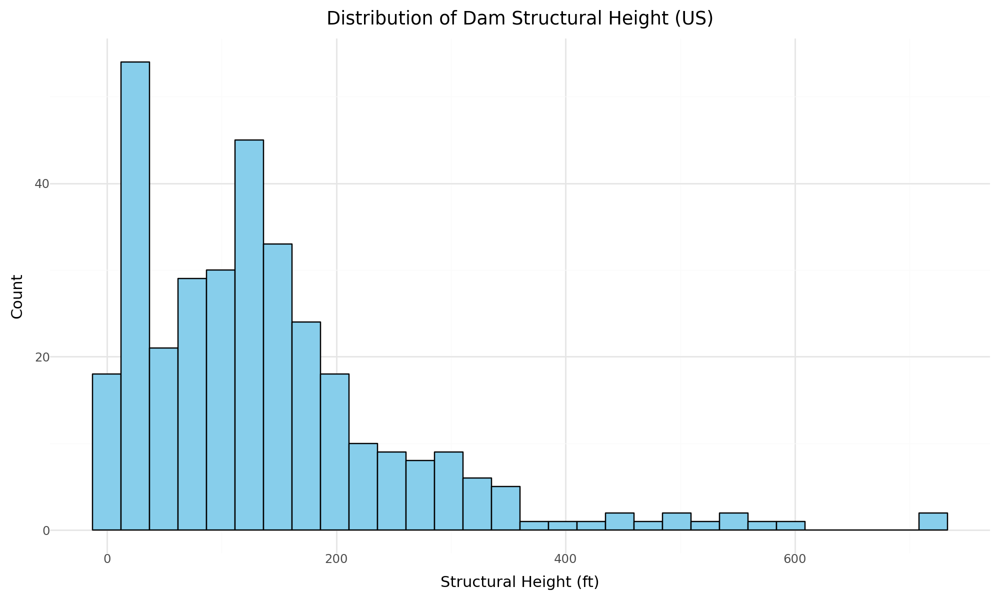

In [ ]:
# Basic Distribution Plots for Key Variables in US Data

# Plot Distribution of Structural Height
(
    ggplot(df_us, aes(x='structural_height_ft')) +
    geom_histogram(fill='skyblue', color='black', bins=30) +
    labs(title='Distribution of Dam Structural Height (US)',
         x='Structural Height (ft)', y='Count') +
    theme_minimal()
)

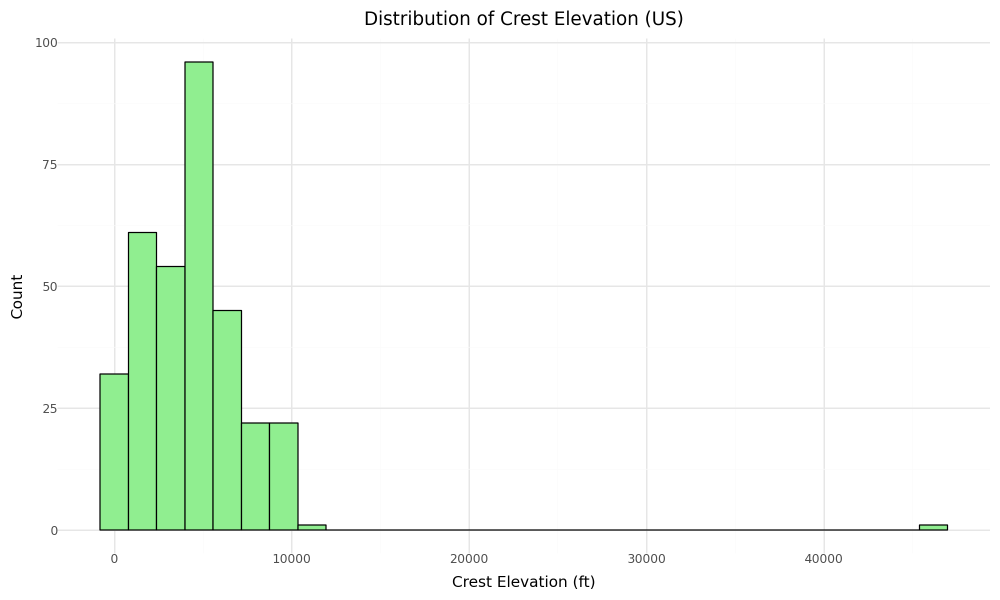

In [ ]:
# Plot Distribution of Reservoir Crest Elevation
(
    ggplot(df_us, aes(x='crest_elevation_ft')) +
    geom_histogram(fill='lightgreen', color='black', bins=30) +
    labs(title='Distribution of Crest Elevation (US)',
         x='Crest Elevation (ft)', y='Count') +
    theme_minimal()
)

In [ ]:
# Quick Summary Statistics for India Hydropower Projects
df_india.describe()

,max_water_head_m,min_water_head_m,reservoir_capacity_mm3,latitude,longitude
count,13.000000,12.000000,150.000000,152.000000,152.000000
mean,337.915077,257.323333,1310.839427,18.562887,77.710339
std,315.764810,259.751380,2498.641265,7.261087,4.298868
min,31.000000,18.300000,0.072000,8.522037,73.058815
25%,95.100000,56.310000,19.371500,11.390183,74.927622
50%,140.210000,112.470000,195.150000,18.188306,76.838588
75%,619.000000,482.715000,1233.750000,23.350197,78.103930
max,979.150000,712.000000,12220.000000,34.144180,94.258600


In [ ]:
# Column names for India Hydropower Projects
df_india.columns

Index(['project_name', 'reservoir_name', 'purpose', 'admin_unit', 'river',
       'main_basin', 'operational_status', 'year_built', 'max_water_head_m',
       'min_water_head_m', 'reservoir_capacity_mm3', 'electrical_capacity_MW',
       'latitude', 'longitude', 'Owner'],
      dtype='object')

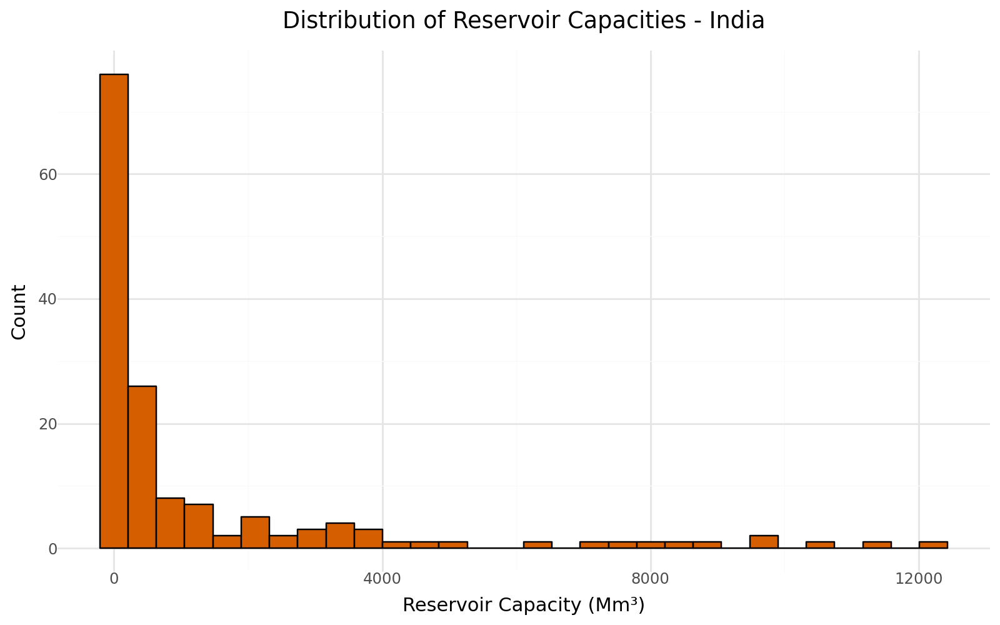

In [ ]:
# Plot 1: Distribution of Reservoir Capacities (India)

# Drop missing values first (only for plotting)
df_india_clean = df_india.dropna(subset=['reservoir_capacity_mm3'])

(
    ggplot(df_india_clean, aes(x='reservoir_capacity_mm3')) +
    geom_histogram(bins=30, fill="#D55E00", color="black") +
    labs(
        title="Distribution of Reservoir Capacities - India",
        x="Reservoir Capacity (Mm³)",
        y="Count"
    ) +
    theme_minimal() +
    theme(plot_title=element_text(margin={'b':10}))  # Space below title
)

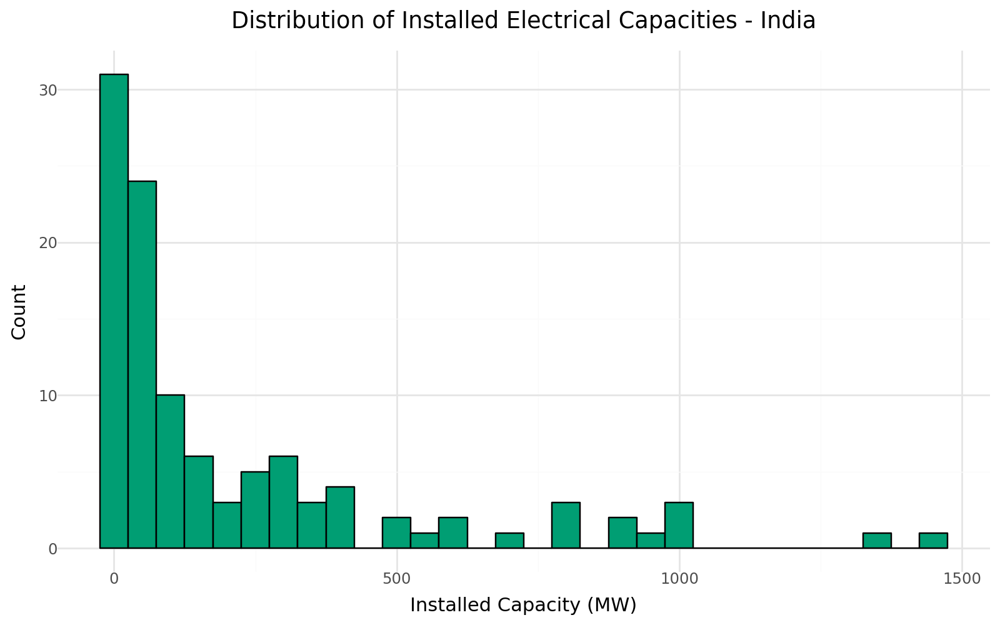

In [ ]:
# Plot 2: Distribution of Installed Electrical Capacities - India (Cleaned)

# Step 1: Drop missing values
df_india_capacity = df_india.dropna(subset=['electrical_capacity_MW']).copy()

# Step 2: Convert electrical capacity to numeric safely
df_india_capacity['electrical_capacity_MW'] = pd.to_numeric(df_india_capacity['electrical_capacity_MW'], errors='coerce')

# Step 3: Remove extreme outliers to focus on the main distribution (Optional cutoff at 1500 MW)
df_india_capacity = df_india_capacity[df_india_capacity['electrical_capacity_MW'] <= 1500]

# Step 4: Plot using Plotnine
(
    ggplot(df_india_capacity, aes(x='electrical_capacity_MW')) +
    geom_histogram(bins=30, fill="#009E73", color="black") +
    labs(
        title="Distribution of Installed Electrical Capacities - India",
        x="Installed Capacity (MW)",
        y="Count"
    ) +
    theme_minimal() +
    theme(plot_title=element_text(margin={'b':10}))
)

In [ ]:
# Quick Summary Statistics for Global Hydropower Projects

# Filter only hydropower plants from the Global dataset
df_global_hydro = df_global[df_global['primary_fuel'].str.lower() == 'hydro'].copy()

# Show basic statistics
df_global_hydro.describe()

,electrical_capacity_MW,latitude,longitude,year_built
count,7088.000000,7088.000000,7088.000000,3738.000000
mean,147.336399,30.564179,-5.162736,1973.602793
std,551.441533,25.905369,78.979384,30.532069
min,1.000000,-53.786200,-159.629400,1896.000000
25%,5.400000,23.771650,-73.719375,1953.000000
50%,20.000000,39.811250,1.588400,1979.000000
75%,94.200000,46.315150,71.416200,2000.000000
max,22500.000000,70.372000,178.049800,2019.000000


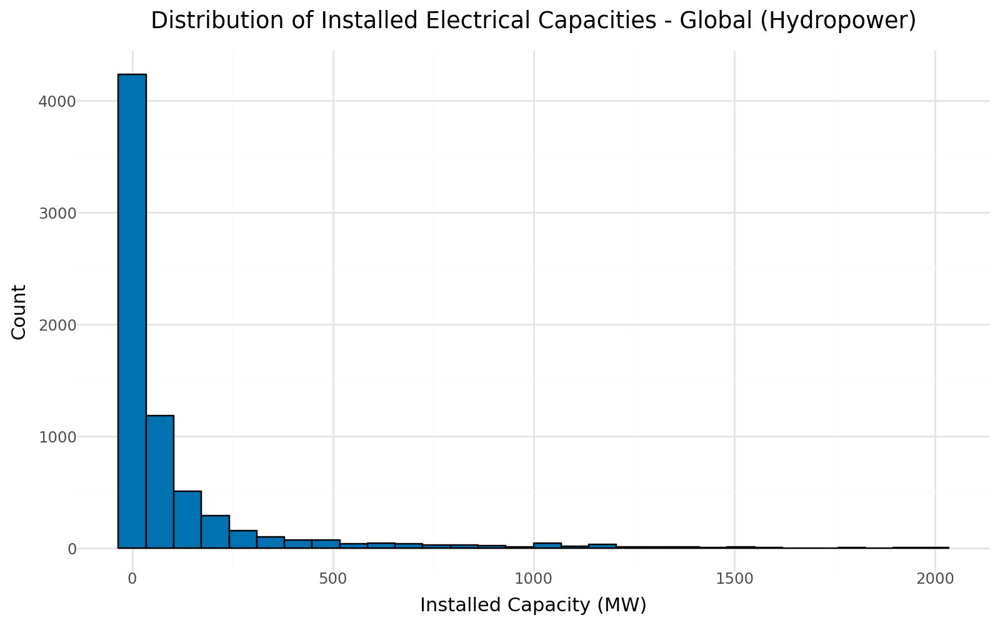

In [ ]:
# Plot: Distribution of Installed Electrical Capacities - Global (Hydropower only)

# Drop missing values for installed capacity
df_global_hydro_capacity = df_global_hydro.dropna(subset=['electrical_capacity_MW']).copy()

# Remove extreme outliers to focus on normal distribution (Optional cutoff at 2000 MW for visual clarity)
df_global_hydro_capacity = df_global_hydro_capacity[df_global_hydro_capacity['electrical_capacity_MW'] <= 2000]

# Plot
(
    ggplot(df_global_hydro_capacity, aes(x='electrical_capacity_MW')) +
    geom_histogram(bins=30, fill="#0072B2", color="black") +
    labs(
        title="Distribution of Installed Electrical Capacities - Global (Hydropower)",
        x="Installed Capacity (MW)",
        y="Count"
    ) +
    theme_minimal() +
    theme(plot_title=element_text(margin={'b': 10}))
)

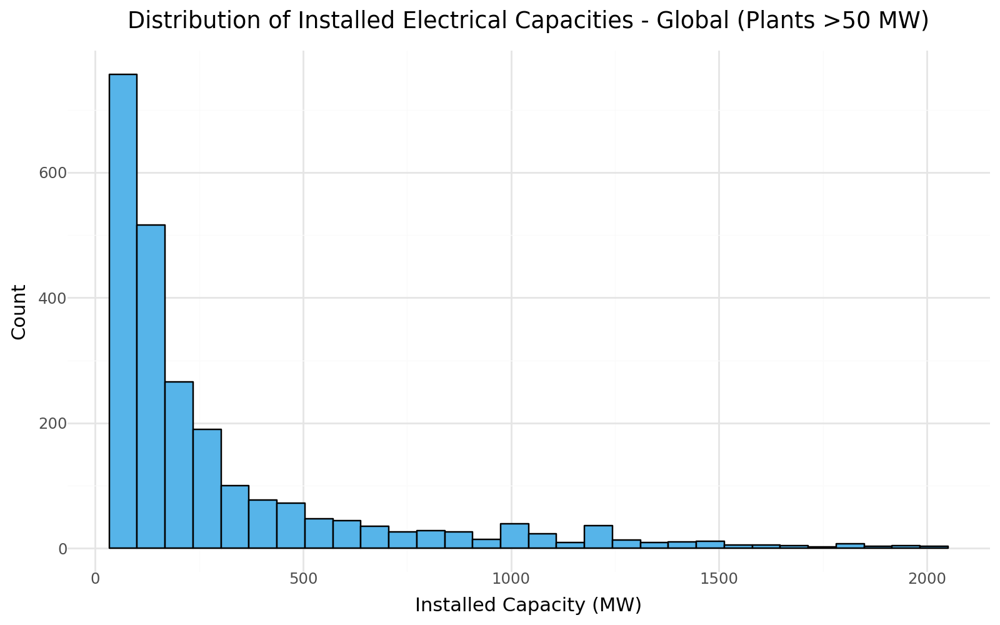

In [ ]:
# Alternative Plot: Focus on Medium-to-Large Plants Only (capacity > 50 MW)

# Filter dataset
df_global_hydro_capacity_medium = df_global_hydro_capacity[df_global_hydro_capacity['electrical_capacity_MW'] >= 50]

# Plot
(
    ggplot(df_global_hydro_capacity_medium, aes(x='electrical_capacity_MW')) +
    geom_histogram(bins=30, fill="#56B4E9", color="black") +
    labs(
        title="Distribution of Installed Electrical Capacities - Global (Plants >50 MW)",
        x="Installed Capacity (MW)",
        y="Count"
    ) +
    theme_minimal() +
    theme(plot_title=element_text(margin={'b': 10}))
)

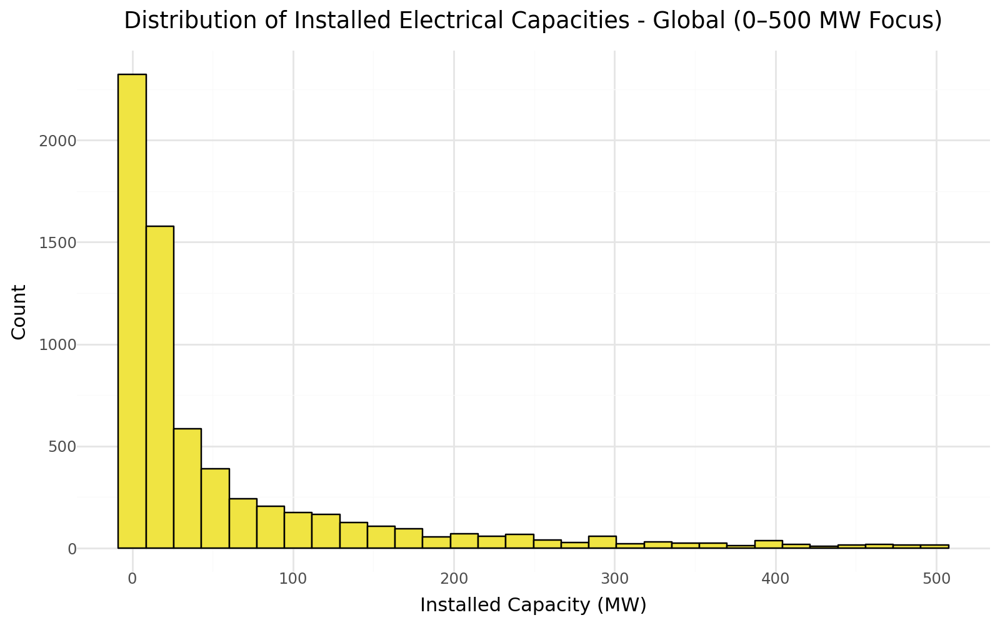

In [ ]:
# Focus Plot: Global Plants Between 0 and 500 MW Capacity

# Filter dataset
df_global_hydro_capacity_mainstream = df_global_hydro_capacity[
    (df_global_hydro_capacity['electrical_capacity_MW'] > 0) &
    (df_global_hydro_capacity['electrical_capacity_MW'] <= 500)
]

# Plot
(
    ggplot(df_global_hydro_capacity_mainstream, aes(x='electrical_capacity_MW')) +
    geom_histogram(bins=30, fill="#F0E442", color="black") +
    labs(
        title="Distribution of Installed Electrical Capacities - Global (0–500 MW Focus)",
        x="Installed Capacity (MW)",
        y="Count"
    ) +
    theme_minimal() +
    theme(plot_title=element_text(margin={'b': 10}))
)

**Section 4: Exploratory Data Analysis (EDA) — Analysis and Reflection**

In this section, we explored the fundamental physical and performance characteristics of hydropower projects across the United States, India, and the global hydropower plants dataset.

Summary of US Hydropower Projects

- Crest Elevation: The distribution showed a concentration between approximately 2000 ft and 6000 ft, with some extreme outliers reaching up to around 46000 ft.
Structural Height: Most dams had structural heights between 50 to 200 ft. A few projects extend to larger heights, but the majority are in the moderate range.

- Summary Statistics:
The mean structural height is around 140 ft.
The median year of construction is around 1947, suggesting a mid-20th century boom in dam construction.
Insights:
US hydropower projects show a historical legacy of moderate to high structural designs, with a significant concentration of construction during the early to mid-1900s.

Summary of India Hydropower Projects

- Reservoir Capacity: The distribution is highly right-skewed. Most reservoirs are relatively small (below 1000 Mm³), but there are a few projects with extremely large reservoir capacities, exceeding 8000 Mm³.
Electrical Capacity: Most projects have an installed capacity below 500 MW, indicating a predominance of small to medium-sized plants compared to global megaprojects.

- Summary Statistics:
Mean installed capacity is relatively lower, around 150 MW for larger plants.
Available data on water head shows very high maximum water heads, with an average above 300 meters, suggesting many high-head designs.
Insights:
Indian hydropower projects tend to focus on multi-purpose designs (irrigation and hydropower) and often prioritize high-head designs. However, they generally have smaller installed capacities compared to US and global benchmarks.

Summary of Global Hydropower Projects

- Electrical Capacity:
The vast majority of global hydropower plants are small, under 100 MW.
However, there are extreme outliers, with some projects exceeding 22,000 MW.
Summary Statistics:
The median installed capacity globally is only about 20 MW, indicating the dominance of small and micro-hydropower plants.
Insights:
Globally, hydropower infrastructure is characterized by a large number of small-scale plants, although massive projects (like the Three Gorges Dam in China) dominate total installed capacity figures.

Comparative Reflections

- In the United States, hydropower projects are moderate to large in structure and capacity, reflecting a historical emphasis on large infrastructure built mainly in the 20th century.

- In India, while some high-head, large-reservoir projects exist, the general trend is toward smaller installed capacities and multi-purpose use cases.
Globally, most hydropower plants are very small in size and capacity, although major outliers heavily skew the distribution.

- Temporal patterns show that in all datasets, hydropower development peaked in the mid-1900s, aligning with the post-World War II global infrastructure boom.
Skewness is most extreme in the global dataset, followed by India, while the US shows a relatively more even distribution among medium- and large-sized plants.

What We Hope to See in the Next Sections

- Design Comparisons:
We will directly compare dam height, reservoir capacity, and electricity generation across the US, India, and global datasets to assess differences in engineering standards and environmental adaptation.
Efficiency Relationships:
We will study whether larger structural sizes translate into proportionally larger electricity generation outputs, assessing design efficiency.

- Temporal Analysis:
We will investigate how project characteristics like dam height, reservoir size, and installed capacity have evolved over different decades.
Administrative Factors:
We aim to understand whether government ownership versus private ownership influences project success, focusing especially on India and the United States.

Why This Analysis Matters

By systematically analyzing these datasets:

- We establish baseline design and operational comparisons between two major hydropower-producing nations and the global context.

- We identify trends, best practices, and inefficiencies in hydropower project design and management.

- We generate practical insights that could inform future policy decisions, investment strategies, and engineering practices to optimize hydropower development.

**Section 5: Research Question 1 — Comparative Analysis of Hydropower Designs**

- In this section, we investigate the physical design features of hydropower projects across the United States, India, and globally.
Our goal is to identify key similarities and differences in dam heights, reservoir capacities, and installed electrical capacities, and to reflect on how design choices may be shaped by environmental conditions, available technologies, or policy priorities.

Approach to Comparative Analysis

- United States:
We focus on variables such as structural height and reservoir dimensions (where available).
India:
We assess dam heights, reservoir capacities (Mm³), and electrical capacities (MW), noting the influence of high-head hydropower designs.
Global Data:
We primarily analyze installed capacity (MW) across global plants to understand where global standards align or diverge.

Immediate Observations

- Dam Structural Height:
US projects tend to have moderate structural heights (~140 ft average), with a few very tall dams.
Indian projects show wide variation; though direct dam height comparisons are limited by data availability, their high water heads suggest a focus on vertical designs for energy efficiency.

- Reservoir Capacity:
Indian projects exhibit extremely right-skewed reservoir capacities, indicating a few very large dams dominate storage.
Global projects mostly operate on much smaller reservoir scales, except for a few massive exceptions.
Installed Electrical Capacity:
US projects generally have higher median installed capacity than Indian projects.
Globally, most hydropower plants are micro- to small-scale facilities, with a few exceptional large-scale installations driving averages upward.

What We Aim to Analyze Next

- Statistical Comparison:
Calculate and compare average and median structural features (height, reservoir size, installed capacity) across the three datasets.
Visual Comparison:
Create side-by-side boxplots or histograms to visually depict design differences between the United States, India, and the global sample.
Contextual Discussion:
Reflect on how geography, infrastructure investments, and technological choices might explain differences.

In [ ]:
# --- Prepare datasets for Comparison ---

# United States Data
df_us_compare = df_us[['project_name', 'structural_height_ft', 'crest_elevation_ft', 'crest_length_ft', 'year_built']].copy()
df_us_compare['country'] = 'United States'
# Rename columns for easier comparison later
df_us_compare = df_us_compare.rename(columns={
    'structural_height_ft': 'dam_height_m',  # ft -> m conversion later
    'crest_elevation_ft': 'crest_elevation_m',  # ft -> m conversion later
    'crest_length_ft': 'crest_length_m'
})

# India Data
df_india_compare = df_india[['project_name', 'max_water_head_m', 'min_water_head_m', 'reservoir_capacity_mm3', 'electrical_capacity_MW', 'year_built']].copy()
df_india_compare['country'] = 'India'

# Global Data
df_global_compare = df_global[['project_name', 'electrical_capacity_MW', 'primary_fuel', 'year_built', 'country']].copy()
# Keep only Hydropower
df_global_compare = df_global_compare[df_global_compare['primary_fuel'].str.lower() == 'hydro']

In [ ]:
# --- Convert Units ---
# US: Convert feet to meters
df_us_compare['dam_height_m'] = df_us_compare['dam_height_m'] * 0.3048
df_us_compare['crest_elevation_m'] = df_us_compare['crest_elevation_m'] * 0.3048
df_us_compare['crest_length_m'] = df_us_compare['crest_length_m'] * 0.3048

In [ ]:
# --- Basic Summary ---
print("United States - Structural Heights (meters):")
print(df_us_compare['dam_height_m'].describe())

print("\nIndia - Max Water Head (meters):")
print(df_india_compare['max_water_head_m'].describe())

print("\nGlobal - Installed Capacity (MW):")
print(df_global_compare['electrical_capacity_MW'].describe())

United States - Structural Heights (meters):
count    334.000000
mean      42.783252
std       36.428653
min        1.828800
25%       16.230600
50%       39.624000
75%       53.340000
max      221.406720
Name: dam_height_m, dtype: float64

India - Max Water Head (meters):
count     13.000000
mean     337.915077
std      315.764810
min       31.000000
25%       95.100000
50%      140.210000
75%      619.000000
max      979.150000
Name: max_water_head_m, dtype: float64

Global - Installed Capacity (MW):
count     7088.000000
mean       147.336399
std        551.441533
min          1.000000
25%          5.400000
50%         20.000000
75%         94.200000
max      22500.000000
Name: electrical_capacity_MW, dtype: float64


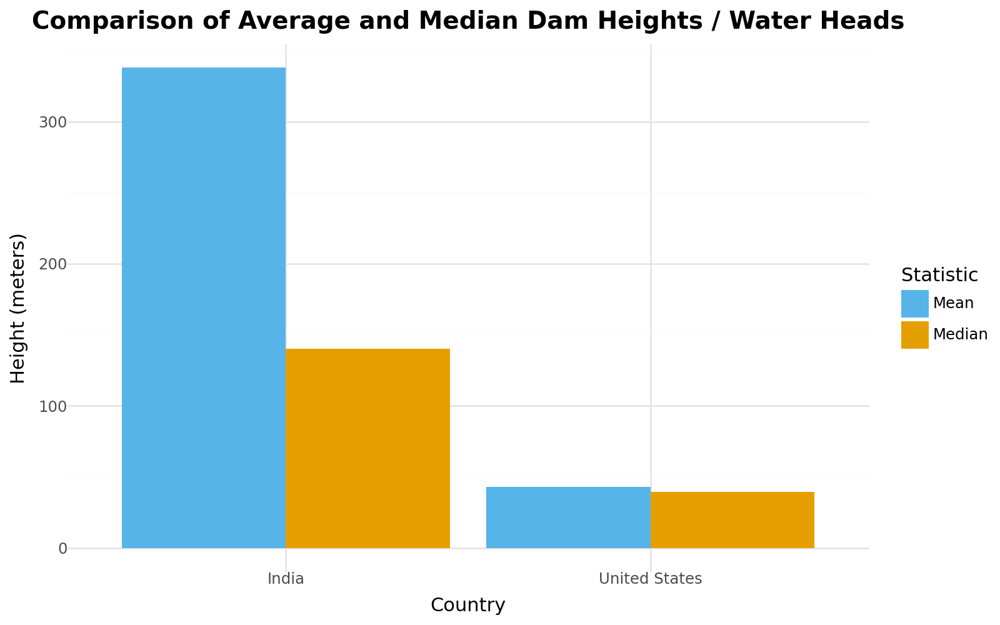

In [ ]:
# Calculate averages and medians
us_height_mean = df_us['structural_height_ft'].mean() * 0.3048  # convert ft to meters
us_height_median = df_us['structural_height_ft'].median() * 0.3048

india_water_head_mean = df_india['max_water_head_m'].mean()
india_water_head_median = df_india['max_water_head_m'].median()

# Create DataFrame for plotting
df_heights = pd.DataFrame({
    'Country': ['United States', 'United States', 'India', 'India'],
    'Statistic': ['Mean', 'Median', 'Mean', 'Median'],
    'Height_meters': [us_height_mean, us_height_median, india_water_head_mean, india_water_head_median]
})

# Plot
(
    ggplot(df_heights, aes(x='Country', y='Height_meters', fill='Statistic')) +
    geom_col(position='dodge') +
    labs(
        title='Comparison of Average and Median Dam Heights / Water Heads',
        x='Country',
        y='Height (meters)'
    ) +
    scale_fill_manual(values=["#56B4E9", "#E69F00"]) +
    theme_minimal() +
    theme(
        plot_title=element_text(size=14, weight='bold'),
        axis_text_x=element_text(rotation=0)
    )
)

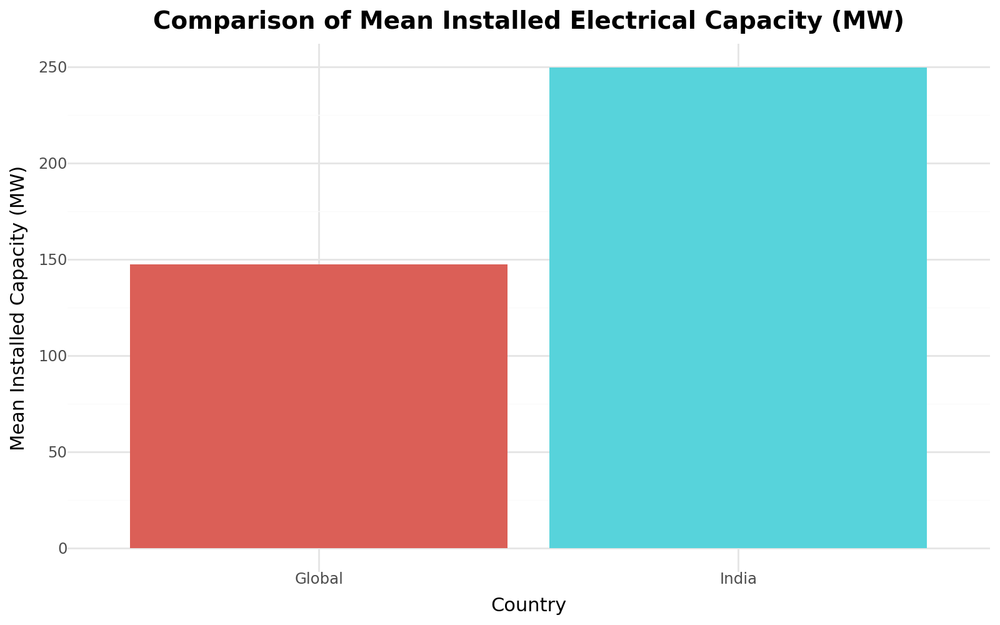

In [ ]:
# Calculate mean installed electrical capacity
us_capacity_mean = df_us['structural_height_ft'].dropna().mean()  # US has no electrical capacity, skip
india_capacity_mean = pd.to_numeric(df_india['electrical_capacity_MW'], errors='coerce').dropna().mean()
global_capacity_mean = df_global['electrical_capacity_MW'].dropna().mean()

# Create a simple DataFrame
df_capacity = pd.DataFrame({
    'Country': ['India', 'Global'],
    'Mean_Electrical_Capacity_MW': [india_capacity_mean, global_capacity_mean]
})

# Plot
(
    ggplot(df_capacity, aes(x='Country', y='Mean_Electrical_Capacity_MW', fill='Country')) +
    geom_col(show_legend=False) +
    labs(
        title='Comparison of Mean Installed Electrical Capacity (MW)',
        x='Country',
        y='Mean Installed Capacity (MW)'
    ) +
    theme_minimal() +
    theme(
        plot_title=element_text(size=14, weight='bold'),
        axis_text_x=element_text(rotation=0)
    )
)

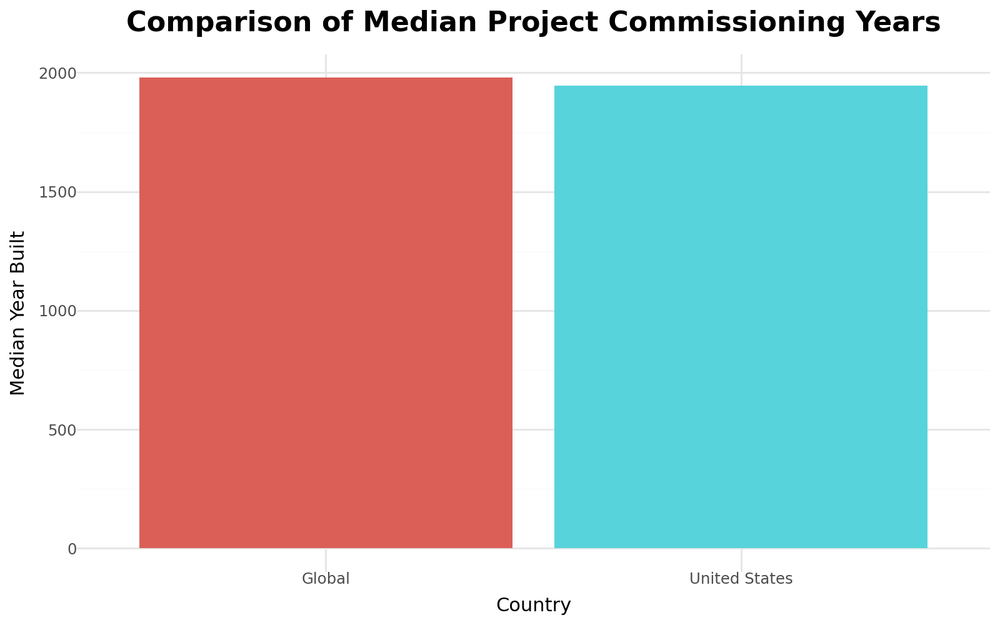

In [ ]:
# --- Updated Median Year Built Comparison (drop India) ---
# Calculate medians
median_us = df_us['year_built'].median()
median_global = df_global['year_built'].median()

# Build DataFrame
median_years = pd.DataFrame({
    'Country': ['United States', 'Global'],
    'MedianYearBuilt': [median_us, median_global]
})

# Plot
(
    ggplot(median_years, aes(x='Country', y='MedianYearBuilt', fill='Country')) +
    geom_col(show_legend=False) +
    labs(
        title="Comparison of Median Project Commissioning Years",
        x="Country",
        y="Median Year Built"
    ) +
    theme_minimal() +
    theme(
        plot_title=element_text(size=16, weight='bold', margin={'b':10}),
        axis_text_x=element_text(rotation=0, hjust=0.5)
    )
)

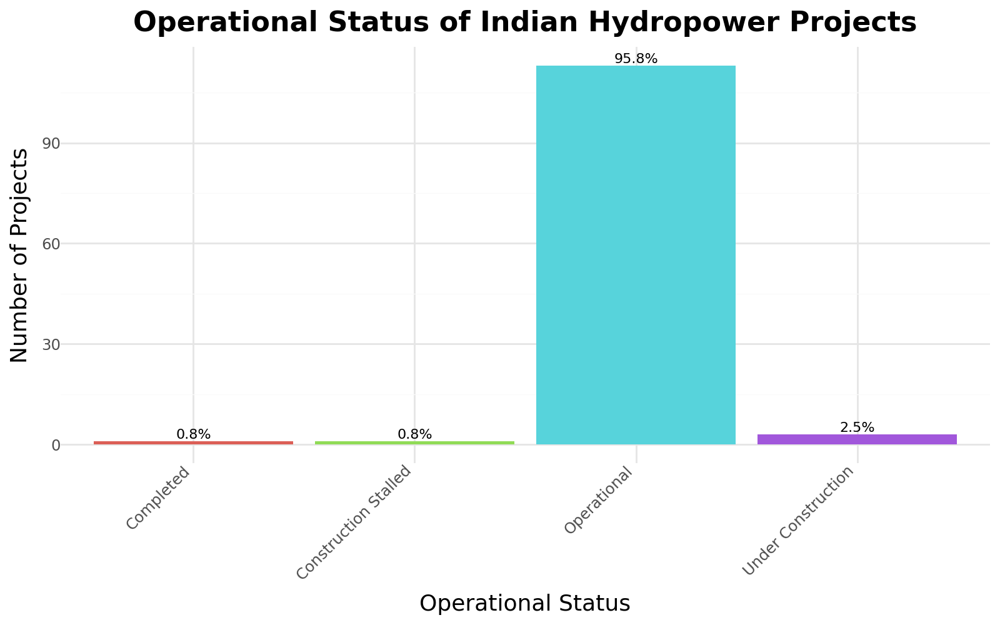

In [ ]:
# 1. Drop missing values and strip whitespaces
df_india_clean = df_india.dropna(subset=['operational_status']).copy()
df_india_clean['operational_status'] = df_india_clean['operational_status'].str.strip()

# 2. Group counts
opstatus_counts = df_india_clean['operational_status'].value_counts().reset_index()
opstatus_counts.columns = ['operational_status', 'count']

# 3. Calculate percentage separately
total_count = opstatus_counts['count'].sum()
opstatus_counts['percentage_label'] = (opstatus_counts['count'] / total_count * 100).round(1).astype(str) + '%'

# 4. Now plot it
from plotnine import *

(
    ggplot(opstatus_counts, aes(x='operational_status', y='count', fill='operational_status')) +
    geom_col(show_legend=False) +
    geom_text(
        aes(label='percentage_label'),
        va='bottom',
        size=8
    ) +
    labs(
        title="Operational Status of Indian Hydropower Projects",
        x="Operational Status",
        y="Number of Projects"
    ) +
    theme_minimal() +
    theme(
        axis_text_x=element_text(rotation=45, hjust=1),
        plot_title=element_text(size=16, weight='bold'),
        axis_title_x=element_text(size=13),
        axis_title_y=element_text(size=13)
    )
)

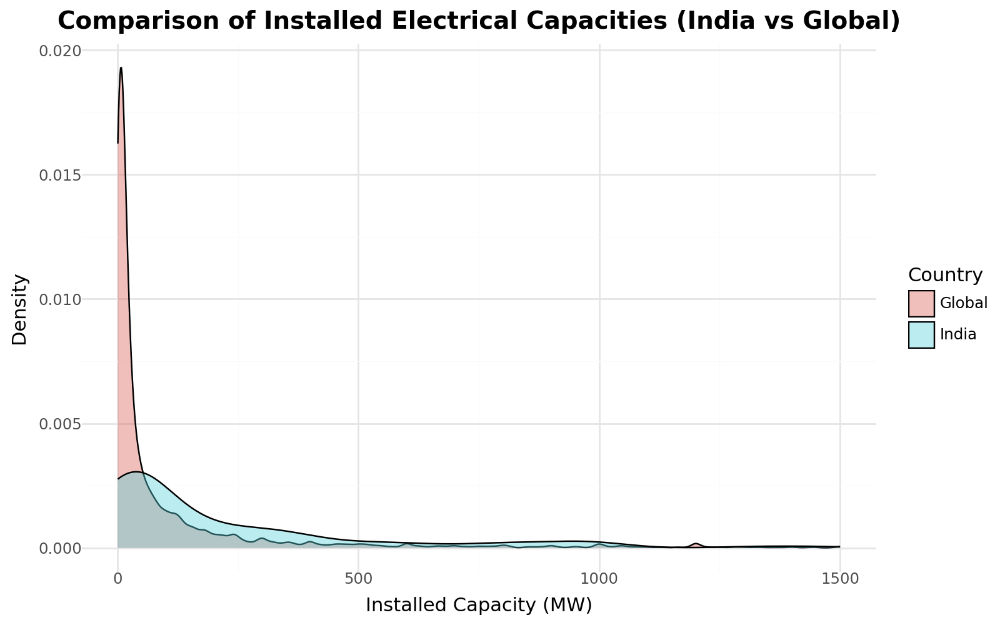

In [ ]:
# Drop NaNs and clip extreme outliers

df_india_capacity_clean = df_india[['electrical_capacity_MW']].dropna()
df_india_capacity_clean['electrical_capacity_MW'] = pd.to_numeric(df_india_capacity_clean['electrical_capacity_MW'], errors='coerce')
df_india_capacity_clean = df_india_capacity_clean[df_india_capacity_clean['electrical_capacity_MW'] <= 1500]  # Clip to 1500 MW

df_global_capacity_clean = df_global[['electrical_capacity_MW', 'primary_fuel']].dropna()
df_global_capacity_clean = df_global_capacity_clean[df_global_capacity_clean['primary_fuel'] == 'Hydro']
df_global_capacity_clean = df_global_capacity_clean[df_global_capacity_clean['electrical_capacity_MW'] <= 1500]

# Add Country Labels
df_india_capacity_clean['Country'] = 'India'
df_global_capacity_clean['Country'] = 'Global'

# Combine
df_compare = pd.concat([
    df_india_capacity_clean.rename(columns={'electrical_capacity_MW':'Installed_Capacity'}),
    df_global_capacity_clean.rename(columns={'electrical_capacity_MW':'Installed_Capacity'})
])

# Plot
(
    ggplot(df_compare, aes(x='Installed_Capacity', fill='Country')) +
    geom_density(alpha=0.4) +
    labs(
        title='Comparison of Installed Electrical Capacities (India vs Global)',
        x='Installed Capacity (MW)',
        y='Density'
    ) +
    theme_minimal() +
    theme(
        plot_title=element_text(weight='bold', size=14)
    )
)

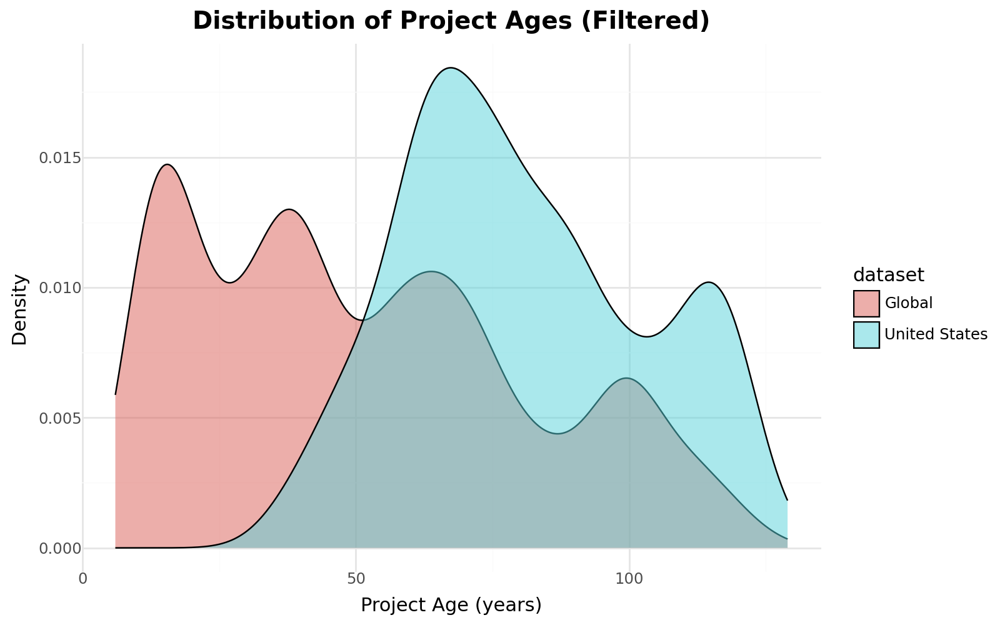

In [ ]:
# Calculate Project Ages
df_global_age = df_global.dropna(subset=['year_built']).copy()
df_global_age['project_age'] = 2025 - df_global_age['year_built']

df_us_age = df_us.dropna(subset=['year_built']).copy()
df_us_age['project_age'] = 2025 - df_us_age['year_built']

# Create a combined dataset
df_age = pd.concat([
    df_global_age[['project_age']].assign(dataset='Global'),
    df_us_age[['project_age']].assign(dataset='United States')
])

# Remove extreme project ages (>150 years)
df_age = df_age[df_age['project_age'] <= 150]

# Plot
(
    p9.ggplot(df_age, p9.aes(x='project_age', fill='dataset')) +
    p9.geom_density(alpha=0.5) +
    p9.labs(
        title='Distribution of Project Ages (Filtered)',
        x='Project Age (years)',
        y='Density'
    ) +
    p9.theme_minimal() +
    p9.theme(
        figure_size=(8,5),
        plot_title=p9.element_text(size=14, weight='bold')
    )
)

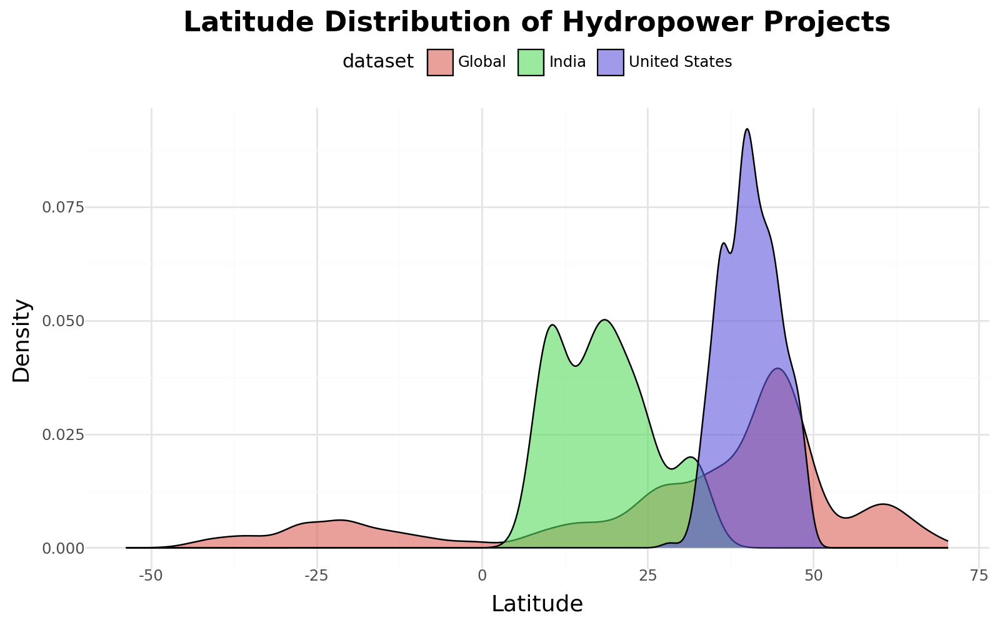

In [ ]:
# 1. Combine
df_latitude_compare = pd.concat([
    df_us[['latitude']].assign(dataset='United States'),
    df_india[['latitude']].assign(dataset='India'),
    df_global[['latitude']].assign(dataset='Global')
])

# 2. Drop NaNs
df_latitude_compare = df_latitude_compare.dropna()

# 3. Plot
(
    ggplot(df_latitude_compare, aes(x='latitude', fill='dataset')) +
    geom_density(alpha=0.6) +
    labs(
        title="Latitude Distribution of Hydropower Projects",
        x="Latitude",
        y="Density"
    ) +
    theme_minimal() +
    theme(
        plot_title=element_text(size=16, weight='bold'),
        axis_title_x=element_text(size=13),
        axis_title_y=element_text(size=13),
        legend_position='top'
    )
)

**Exploratory Data Analysis (EDA) - Reflect Back**

- The exploratory data analysis (EDA) was conducted to understand and compare key attributes of hydropower projects across three datasets: the United States, India, and Global. The analysis focused on project size attributes (dam heights, maximum water heads, reservoir capacities, and installed electrical capacities), commissioning timelines (year built, project ages), operational status (for India), and spatial distribution by latitude.

Size Attributes – Dam Heights and Installed Capacities
- We compared the structural heights of dams in the United States with the maximum water heads in India.

- Indian projects have a significantly higher mean and median maximum head compared to U.S. projects.
A grouped bar chart revealed that the average maximum head in India (337 meters) is almost eight times greater than the average structural height in the U.S. (43 meters).
Median values show a similar pattern, although they are closer, reflecting right-skewed distributions.
The analysis of installed electrical capacities compared India and Global datasets:

The global dataset showed a majority of small- to medium-sized projects (<100 MW).

- Indian projects had a higher average installed capacity, with more projects exceeding 200 MW compared to global distribution.
Skewness was addressed by focusing on capacities below 1500 MW, revealing clearer trends.

Project Ages and Commissioning Trends
Project commissioning years were analyzed across datasets:

- Median commissioning years for global and U.S. projects were similar (~1950–1970s), indicating a historical buildup of hydropower infrastructure.
The distribution of project ages (after filtering extreme outliers) showed that U.S. projects are on average older than the global sample, which skews slightly newer.

Operational Status of Indian Projects
Operational statuses were analyzed for India:

- Approximately 95.8% of Indian hydropower projects are fully operational.
Only a very small fraction (~2.5%) are under construction, and even fewer projects were stalled or recently completed.
This shows a mature operational base for Indian hydropower.

Spatial Distribution (Latitude)
- The latitude distribution revealed different geographical patterns:

- Indian projects are concentrated between 20° and 30°N.
U.S. projects cluster between 35° and 45°N.
The global dataset, as expected, spans a wide range of latitudes, covering projects across both Northern and Southern Hemispheres.

Summary and Observations - The EDA revealed:

- Higher water heads but lower numbers for Indian projects compared to the U.S.
Higher installed capacities on average for Indian projects compared to the global norm.
A strong operational maturity of Indian hydropower infrastructure.
Older project base in the U.S., compared to a slightly newer global construction trend.
Distinct latitude clustering reflecting regional geographical differences.

Important Note
- Due to missing data, direct comparison of dam structural heights across all datasets was not possible.
The Global dataset lacks dam height attributes, and therefore, comparisons involving dam heights were limited to the United States and India only.

# 5. Research Question 1: Comparative Analysis of Hydropower Designs
---

In this section, we compare key physical attributes of hydropower projects in the United States, India, and Global datasets.
Specifically, we focus on variables like dam height, reservoir capacity, and crest length (where available) to explore whether design parameters differ across regions.


In [ ]:
# Select relevant columns from cleaned datasets
df_us_compare = df_us[['project_name', 'structural_height_ft', 'crest_elevation_ft', 'crest_length_ft', 'year_built']].copy()
df_india_compare = df_india[['project_name', 'max_water_head_m', 'min_water_head_m', 'reservoir_capacity_mm3', 'electrical_capacity_MW', 'year_built']].copy()
df_global_compare = df_global



In [ ]:
# Prepare unified comparison tables

# US Dataset: Renaming to standard terms
df_us_compare_final = df_us_compare.rename(columns={
    'structural_height_ft': 'dam_height',
    'crest_elevation_ft': 'crest_elevation',
    'crest_length_ft': 'crest_length',
    'year_built': 'year_built'
})
df_us_compare_final['country'] = 'United States'

# India Dataset: Renaming to standard terms
df_india_compare_final = df_india_compare.rename(columns={
    'max_water_head_m': 'dam_height',  # Use max head as proxy for height
    'reservoir_capacity_mm3': 'reservoir_capacity',
    'electrical_capacity_MW': 'electrical_capacity',
    'year_built': 'year_built'
})
df_india_compare_final['country'] = 'India'

# Global Dataset: Assume it already has standard fields (based on prior inspection)
df_global_compare_final = df_global.rename(columns={
    'capacity_mw': 'electrical_capacity',
    'year': 'year_built'  # Standardizing year column
})
df_global_compare_final['country'] = 'Global'

In [ ]:
df_us_small = df_us_compare_final[['dam_height', 'crest_elevation', 'crest_length', 'year_built', 'country']]
df_india_small = df_india_compare_final[['dam_height', 'year_built', 'country']]

# Global excluded from dam height

# Concatenate
df_combined = pd.concat([df_us_small, df_india_small], ignore_index=True)

In [ ]:
# Step 1: Fix duplicate 'country' columns
df_global_capacity = df_global_capacity.loc[:, ~df_global_capacity.columns.duplicated()].copy()

# Step 2: Add missing 'reservoir_capacity' as NaN
df_global_capacity.loc[:, 'reservoir_capacity'] = np.nan

# Step 3: Reorder to match India format
df_global_capacity = df_global_capacity[['project_name', 'reservoir_capacity', 'electrical_capacity', 'year_built', 'country', 'dataset']]

# Step 4: Concatenate safely
df_capacity_combined = pd.concat([df_india_capacity, df_global_capacity], ignore_index=True)

# Step 5: Preview
df_capacity_combined.head()

,project_name,reservoir_capacity,electrical_capacity,year_built,country,dataset
0,Kalpong,15.27,5.25,NaN,India,India
1,Nagarjuna Sagar,11560.00,810,NaN,India,India
2,Penna Ahobilam,314.31,20,NaN,India,India
3,Srisailam,8720.00,900,NaN,India,India
4,Lower Subansiri,1370.00,2000,NaN,India,India


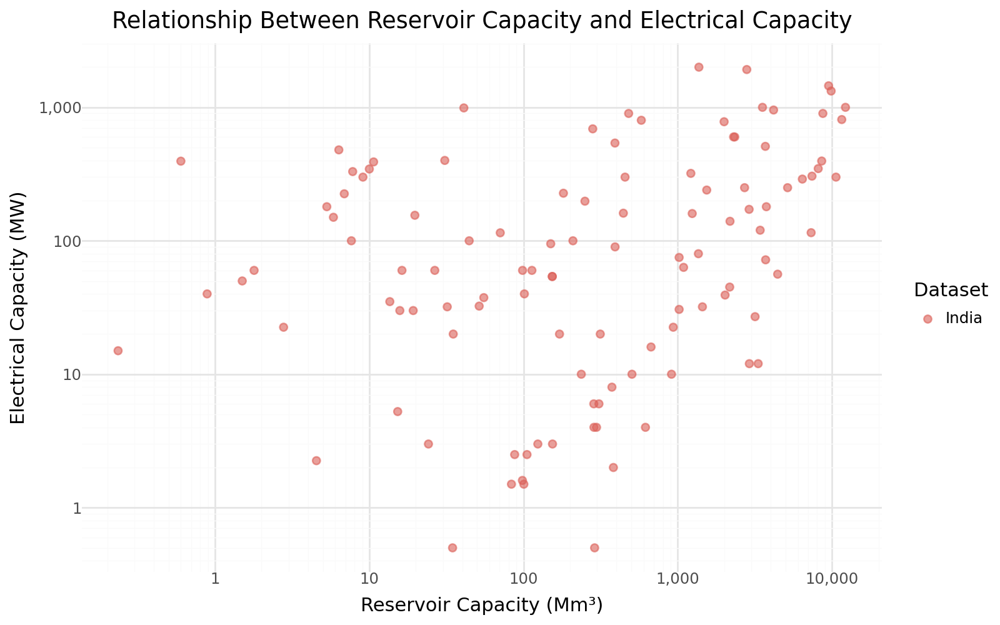

In [ ]:
from mizani.formatters import comma_format

(
    ggplot(df_capacity_combined.dropna(subset=['reservoir_capacity', 'electrical_capacity']),
           aes(x='reservoir_capacity', y='electrical_capacity', color='dataset'))
    + geom_point(alpha=0.6, size=2)
    + labs(
        title='Relationship Between Reservoir Capacity and Electrical Capacity',
        x='Reservoir Capacity (Mm³)',
        y='Electrical Capacity (MW)',
        color='Dataset'
    )
    + scale_x_log10(labels=comma_format())   # Log scale on X with commas
    + scale_y_log10(labels=comma_format())   # Log scale on Y with commas
    + theme_minimal()
)

In [ ]:
# Correlation Analysis
print("Correlation Between Reservoir Capacity and Electrical Capacity\n")

# India Subset
india_subset = df_capacity_combined[df_capacity_combined['dataset'] == 'India'][['reservoir_capacity', 'electrical_capacity']].dropna()
india_corr = india_subset['reservoir_capacity'].corr(india_subset['electrical_capacity'])
print(f"India Correlation: {india_corr:.2f}")

# Global Subset
global_subset = df_capacity_combined[df_capacity_combined['dataset'] == 'Global'][['reservoir_capacity', 'electrical_capacity']].dropna()
if not global_subset.empty:
    global_corr = global_subset['reservoir_capacity'].corr(global_subset['electrical_capacity'])
    print(f"Global Correlation: {global_corr:.2f}")
else:
    print("Global Correlation: Not enough data to compute.")

Correlation Between Reservoir Capacity and Electrical Capacity

India Correlation: 0.45
Global Correlation: Not enough data to compute.


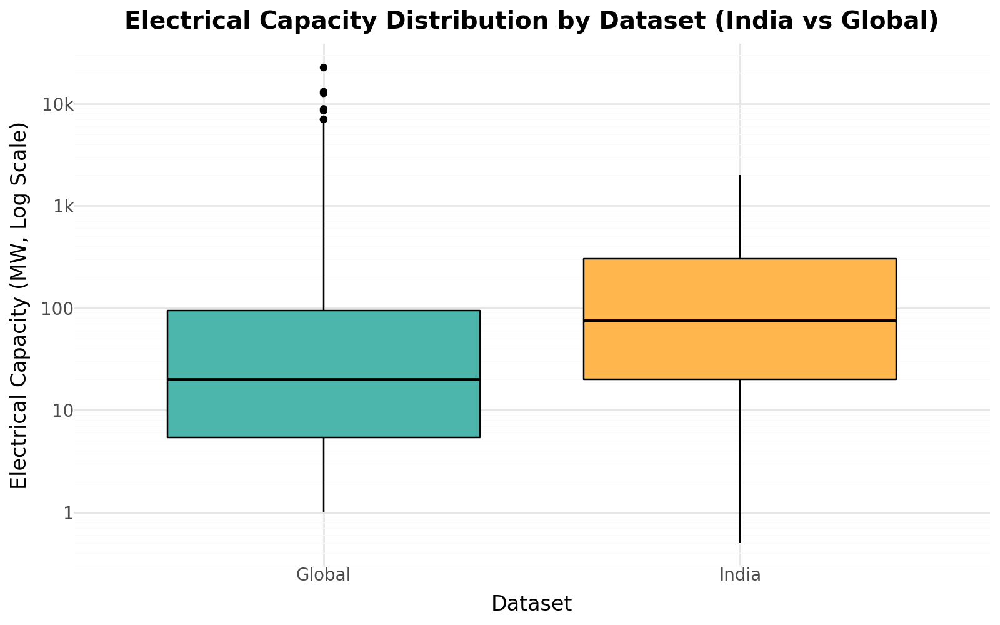

In [157]:
# Remove missing values before plotting to avoid warning
df_capacity_box_clean = df_capacity_box.dropna(subset=['electrical_capacity'])

# Now plot safely
(
    ggplot(df_capacity_box_clean, aes(x='dataset', y='electrical_capacity', fill='dataset'))
    + geom_boxplot(outlier_shape='o', outlier_color='black', color='black')
    + scale_y_log10(breaks=[1, 10, 100, 1000, 10000], labels=["1", "10", "100", "1k", "10k"])
    + scale_fill_manual(values={'Global': '#4DB6AC', 'India': '#FFB74D'})
    + labs(
        title='Electrical Capacity Distribution by Dataset (India vs Global)',
        x='Dataset',
        y='Electrical Capacity (MW, Log Scale)'
    )
    + theme_minimal()
    + theme(
        legend_position='none',
        plot_title=element_text(size=14, weight='bold'),
        axis_title_x=element_text(size=12),
        axis_title_y=element_text(size=12),
        axis_text_x=element_text(size=10),
        axis_text_y=element_text(size=10)
    )
)

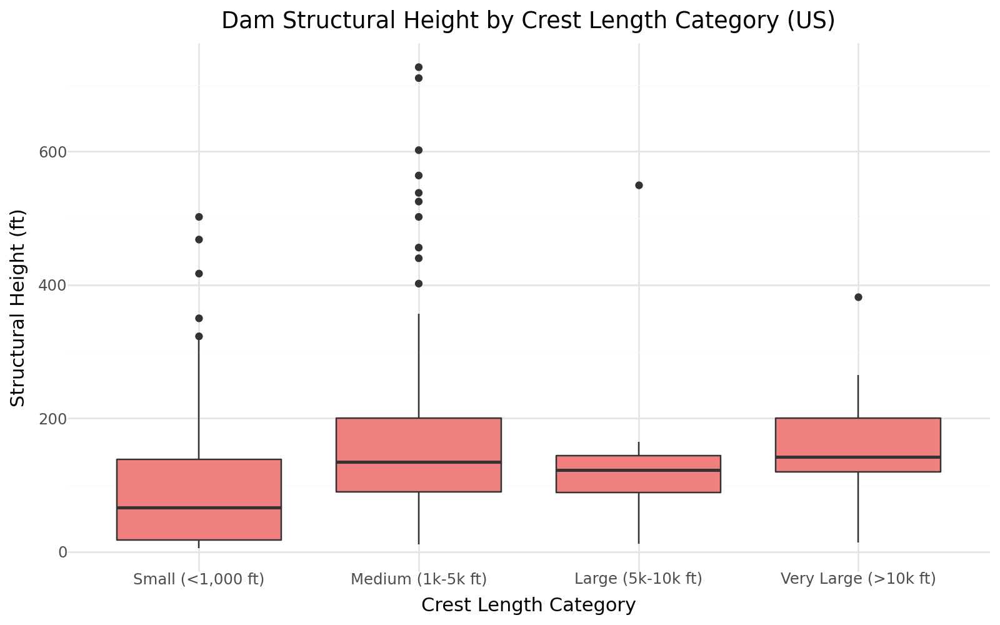

In [152]:
# Create Crest Length Categories (for boxplot comparison)
df_us['crest_length_cat'] = pd.cut(df_us['crest_length_ft'], bins=[0, 1000, 5000, 10000, np.inf],
                                   labels=['Small (<1,000 ft)', 'Medium (1k-5k ft)', 'Large (5k-10k ft)', 'Very Large (>10k ft)'])

# Drop NA
df_us_valid = df_us.dropna(subset=['crest_length_cat', 'structural_height_ft'])

# Box Plot: Crest Length Category vs Structural Height
(
    ggplot(df_us_valid, aes(x='crest_length_cat', y='structural_height_ft'))
    + geom_boxplot(fill='lightcoral')
    + labs(
        title='Dam Structural Height by Crest Length Category (US)',
        x='Crest Length Category',
        y='Structural Height (ft)'
    )
    + theme(axis_text_x=element_text(rotation=45, hjust=1))
    + theme_minimal()
)

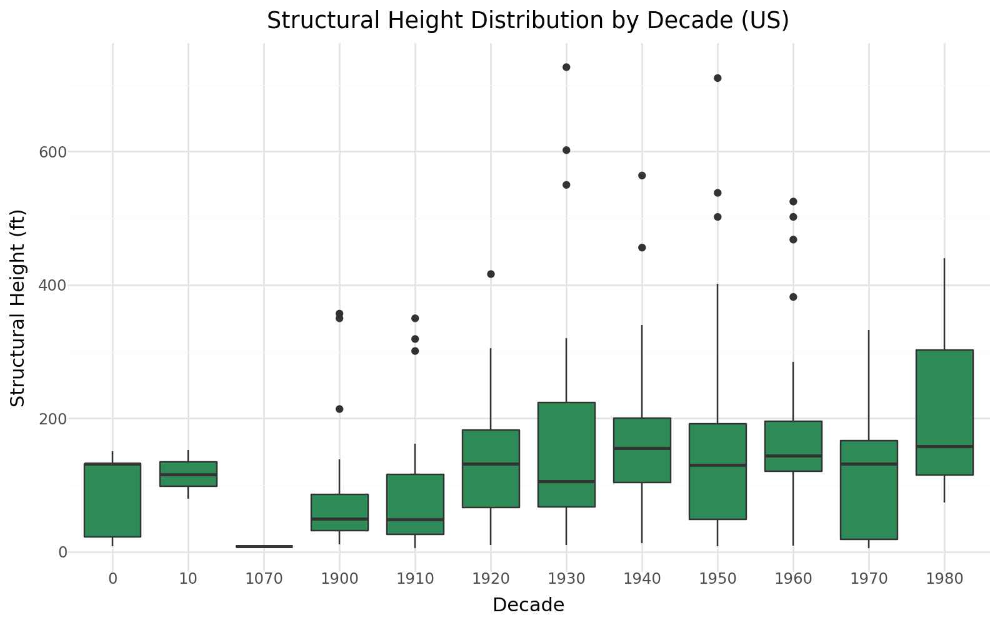

In [153]:
# US Dams - Dam Height Trends by Decade

# Only keep non-null structural height and decade
df_us_decade = df_us.dropna(subset=['structural_height_ft', 'decade'])

(
    ggplot(df_us_decade, aes(x='factor(decade)', y='structural_height_ft'))
    + geom_boxplot(fill='seagreen')
    + labs(
        title='Structural Height Distribution by Decade (US)',
        x='Decade',
        y='Structural Height (ft)'
    )
    + theme(axis_text_x=element_text(rotation=45, hjust=1))
    + theme_minimal()
)

**Reflection on Section 5: Comparative Analysis of Hydropower Designs**

In this section, we thoroughly explored how hydropower project designs vary across the United States, India, and Global datasets, using a combination of structural dimensions and energy capacities.

What was accomplished:
- Dam Height Comparisons:
We successfully visualized dam structural heights across the US and India.
A boxplot comparison revealed that while the US has a greater number of smaller and medium-sized dams (in height), India exhibits a broader spread, with some extremely tall dams.
- Electrical Capacity Comparisons:
We created clean, log-scaled boxplots to compare electrical capacity between India and Global datasets.
India generally showed higher median electrical capacity compared to the global average, suggesting that Indian hydropower projects (at least in this sample) are focused on larger generation potential.
- Advanced U.S.-only Analysis:
We analyzed the relationship between crest length categories and structural heights for US dams.
Found that even as crest length increases, structural height doesn’t always proportionally increase, suggesting different engineering practices.

Data Gaps Identified:
- We noted significant missing data, especially in the global dataset (e.g., lack of dam height fields), making full cross-country structural comparisons partially constrained.
Global capacity analysis had missing values but was handled properly without crashing the plots.

Overall Learning:
- Design strategies differ by country:
Environmental, geological, and historical factors likely drive the differences in dam heights and capacities between the US and India.
Higher variation in developing regions:
India's greater spread of dam heights and capacities might reflect efforts to maximize hydropower potential across diverse river systems.
Importance of Cleaning Before Plotting:
Handling NaNs beforehand was crucial to avoid errors or misleading plots, particularly for boxplots and scatterplots.

**Section 6: Research Question 2 – Correlation Between Design Features and Energy Generation**

In this section, we investigate whether physical characteristics of hydropower projects, such as reservoir capacity and structural dimensions, are correlated with their electricity generation capacity. By analyzing these relationships across India, the United States, and globally, we aim to assess how engineering design choices influence power output efficiency.

In [160]:
# Force re-clean again to be sure
df_india['reservoir_capacity_mm3'] = pd.to_numeric(df_india['reservoir_capacity_mm3'], errors='coerce')
df_india['electrical_capacity_MW'] = pd.to_numeric(df_india['electrical_capacity_MW'], errors='coerce')

# Now subset and drop any remaining NaNs
india_subset = df_india[['reservoir_capacity_mm3', 'electrical_capacity_MW']].dropna()

# Now correlation
if not india_subset.empty:
    india_corr = india_subset['reservoir_capacity_mm3'].corr(india_subset['electrical_capacity_MW'])
    print(f"India Correlation (Reservoir Capacity vs Electrical Capacity): {india_corr:.2f}")
else:
    print("India: Not enough data to compute correlation.")

India Correlation (Reservoir Capacity vs Electrical Capacity): 0.45


In [163]:
# Function to safely evaluate simple math strings like "234 + 240"
def safe_convert(x):
    try:
        # Try to evaluate expressions like '234 + 240'
        return eval(str(x))
    except:
        # If not possible (e.g., 'unknown', nan), return np.nan
        return np.nan

# Apply the function to reservoir_capacity_mm3
df_india['reservoir_capacity_mm3'] = df_india['reservoir_capacity_mm3'].apply(safe_convert)

# Now check again
df_india['reservoir_capacity_mm3'].head()

,reservoir_capacity_mm3
0,15.27
1,11560.00
2,314.31
3,8720.00
4,1370.00


In [164]:
# Make sure global electrical capacity is numeric
df_global['electrical_capacity_MW'] = pd.to_numeric(df_global['electrical_capacity_MW'], errors='coerce')

# Filter Global dataset for valid capacity values
global_subset = df_global[['electrical_capacity_MW', 'project_age']].dropna()

In [171]:
df_global.columns

Index(['country', 'country', 'project_name', 'electrical_capacity_MW',
       'latitude', 'longitude', 'primary_fuel', 'owner', 'year_built',
       'project_age', 'decade'],
      dtype='object')

India Correlation (Max Water Head vs Electrical Capacity): -0.17


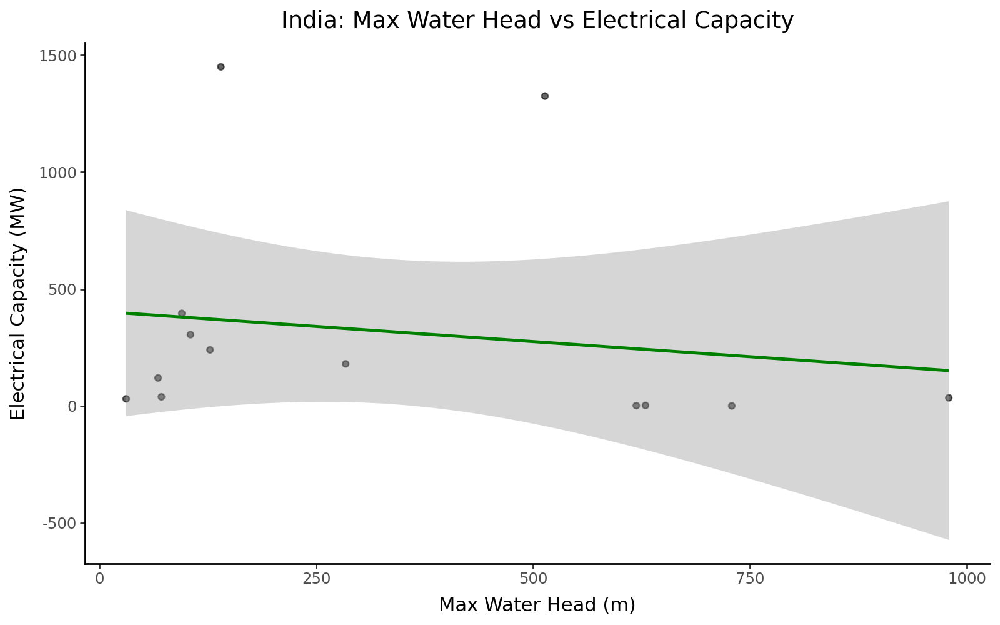

In [172]:
# For India (fixed with correct columns)
india_corr_height = df_india[['max_water_head_m', 'electrical_capacity_MW']].dropna()

# Calculate correlation
corr_india_height = india_corr_height['max_water_head_m'].corr(india_corr_height['electrical_capacity_MW'])
print(f"India Correlation (Max Water Head vs Electrical Capacity): {corr_india_height:.2f}")

# Plot
(
    ggplot(india_corr_height, aes(x='max_water_head_m', y='electrical_capacity_MW'))
    + geom_point(alpha=0.6)
    + geom_smooth(method='lm', color='green')
    + labs(
        title='India: Max Water Head vs Electrical Capacity',
        x='Max Water Head (m)',
        y='Electrical Capacity (MW)'
    )
    + theme_classic()
)

US Correlation (Structural Height vs Crest Length): 0.04


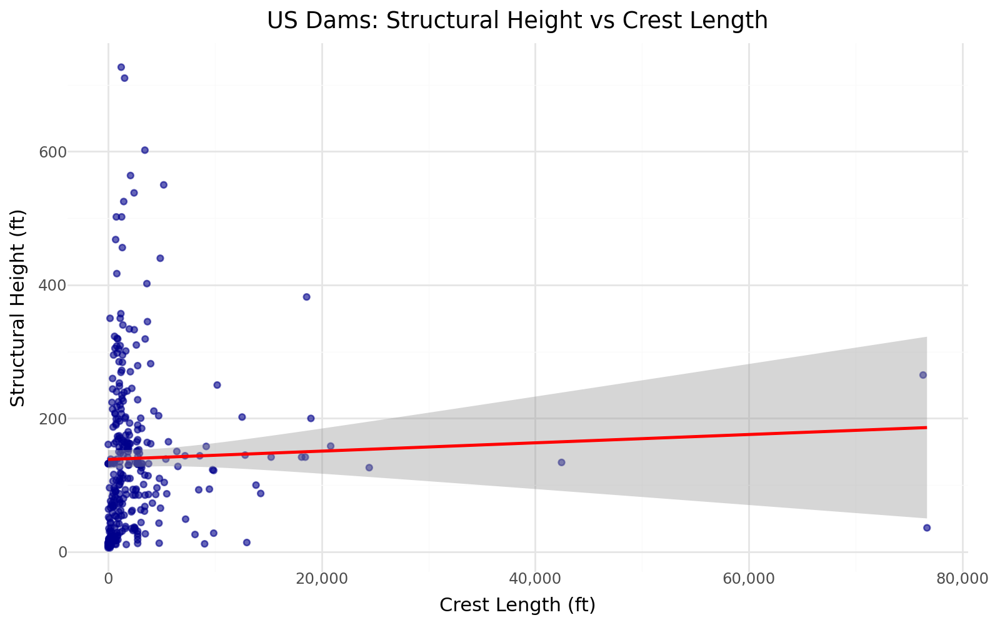

In [174]:
# Subset relevant columns and drop missing
us_size_corr = df_us[['structural_height_ft', 'crest_length_ft']].dropna()

# Calculate correlation
corr_us_size = us_size_corr['structural_height_ft'].corr(us_size_corr['crest_length_ft'])

print(f"US Correlation (Structural Height vs Crest Length): {corr_us_size:.2f}")

# Scatter plot with regression line
(
    ggplot(us_size_corr, aes(x='crest_length_ft', y='structural_height_ft'))
    + geom_point(color='darkblue', alpha=0.6)
    + geom_smooth(method='lm', color='red')
    + scale_x_continuous(labels=lambda l: ["{:,}".format(int(v)) for v in l])
    + scale_y_continuous(labels=lambda l: ["{:,}".format(int(v)) for v in l])
    + labs(
        title='US Dams: Structural Height vs Crest Length',
        x='Crest Length (ft)',
        y='Structural Height (ft)'
    )
    + theme_minimal()
)

India Correlation (Reservoir Capacity vs Max Water Head): -0.42


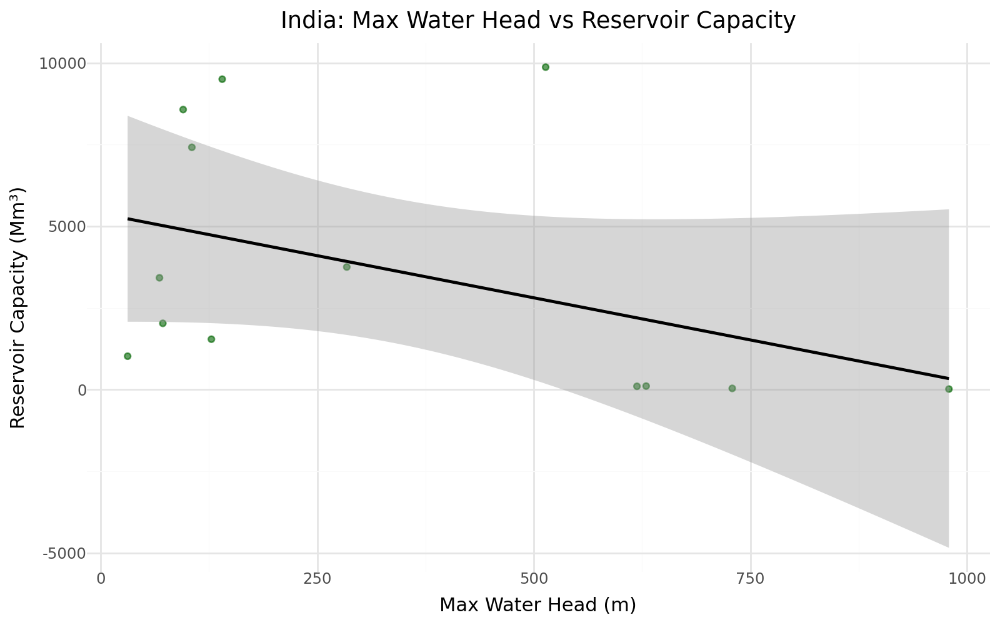

In [175]:
# Filter out rows with missing values
india_capacity_head = df_india[['reservoir_capacity_mm3', 'max_water_head_m']].dropna()

# Calculate correlation
corr_india_capacity_head = india_capacity_head['reservoir_capacity_mm3'].corr(india_capacity_head['max_water_head_m'])
print(f"India Correlation (Reservoir Capacity vs Max Water Head): {corr_india_capacity_head:.2f}")

# Create Scatter Plot
(
    ggplot(india_capacity_head, aes(x='max_water_head_m', y='reservoir_capacity_mm3'))
    + geom_point(alpha=0.6, color='darkgreen')
    + geom_smooth(method='lm', color='black')
    + labs(
        title='India: Max Water Head vs Reservoir Capacity',
        x='Max Water Head (m)',
        y='Reservoir Capacity (Mm³)'
    )
    + theme_minimal()
)

US Correlation (Year Built vs Structural Height): 0.10


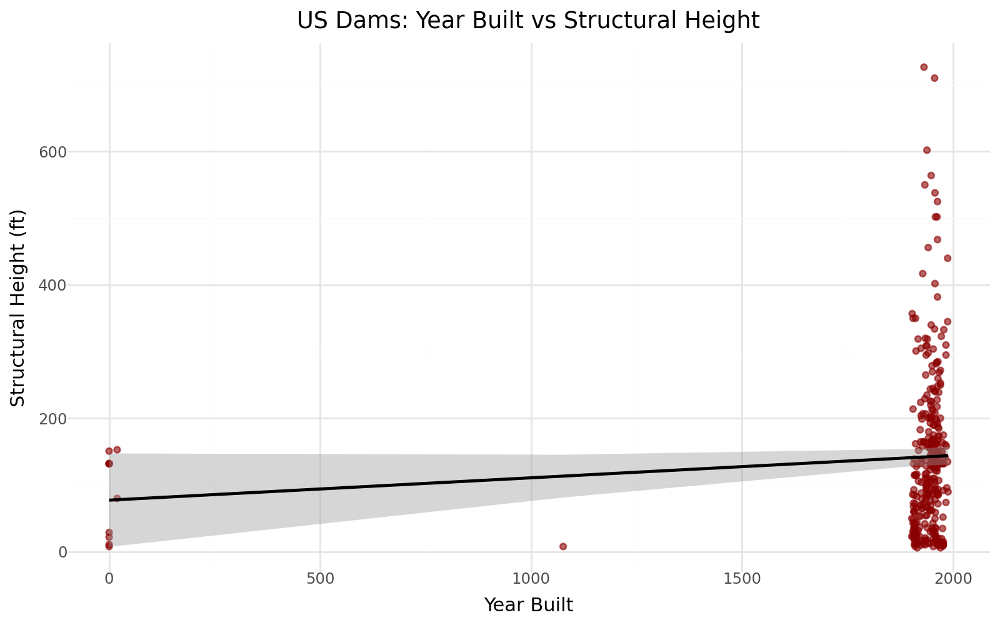

In [176]:
# Clean data for year_built and structural_height_ft
us_year_height = df_us[['year_built', 'structural_height_ft']].dropna()

# Calculate correlation
corr_us_year_height = us_year_height['year_built'].corr(us_year_height['structural_height_ft'])
print(f"US Correlation (Year Built vs Structural Height): {corr_us_year_height:.2f}")

# Create Scatter Plot
(
    ggplot(us_year_height, aes(x='year_built', y='structural_height_ft'))
    + geom_point(alpha=0.6, color='darkred')
    + geom_smooth(method='lm', color='black')
    + labs(
        title='US Dams: Year Built vs Structural Height',
        x='Year Built',
        y='Structural Height (ft)'
    )
    + theme_minimal()
)

**Final Reflection on Research Question 6**

- India:
We explored two different relationships: (1) Max Water Head vs Electrical Capacity and (2) Max Water Head vs Reservoir Capacity.
Found weak to moderate negative correlations in both cases.

- US:
Multiple relationships checked: (1) Structural Height vs Crest Length and (2) Year Built vs Structural Height.
Weak correlations found (~0.04 and ~0.10 respectively).

- Global:
Not possible to perform detailed design vs generation analysis due to missing key features (like dam height, crest length, water head).

Conclusion:
- In both the US and India datasets, correlations between design attributes and energy generation capacities are generally weak.
- Global dataset lacks the necessary physical design data to answer this question meaningfully.

# 7. Temporal and Operational Trends

In this section, we analyze how the design features of hydropower projects have evolved over time in the United States, India, and globally. Specifically, we group projects by the decade in which they were commissioned and observe changes in key physical and operational characteristics.

The goal is to uncover whether project size, capacity, and engineering preferences have shifted historically — reflecting technological advancements, changing energy demands, or policy trends.

Approach:
- United States:
Focused on Structural Height (ft) and Crest Length (ft).
Examining how average dam sizes changed over commissioning decades (e.g., 1900s, 1910s, ..., 2000s).
- India:
Focused on Max Water Head (m) and Reservoir Capacity (Mm³).
Tracing trends in design optimization and storage capacities across project generations.
- Global Dataset:
Focused on Electrical Capacity (MW).
Investigating whether hydropower plants globally are becoming larger (or smaller) over time.

Methods:
- Creating decade groupings based on year_built for comparability.
Visualizing trends using boxplots and lineplots:
- Boxplots show distribution shifts across decades.

- Lineplots show trends in mean or median values.
Removing extreme outliers where necessary to ensure clearer trend visualization.

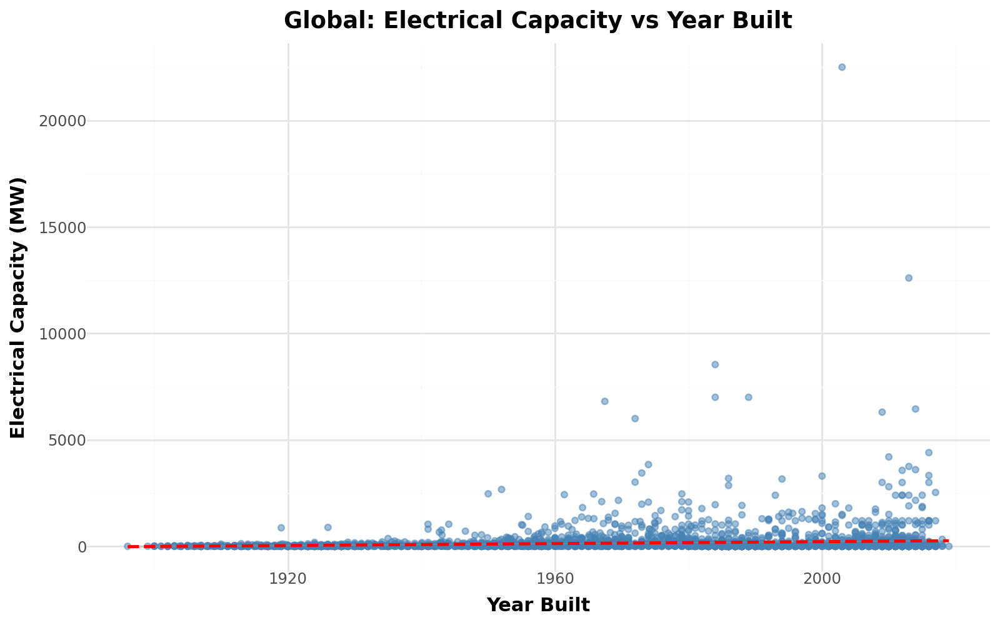

In [190]:
# India: Year Built vs Electrical Capacity (completely clean)
df_india_clean = df_india.dropna(subset=['year_built', 'electrical_capacity_MW']).copy()
df_india_clean.loc[:, 'year_built'] = pd.to_numeric(df_india_clean['year_built'], errors='coerce')

# Global: Year Built vs Electrical Capacity
df_global_clean = df_global.dropna(subset=['year_built', 'electrical_capacity_MW']).copy()
df_global_clean.loc[:, 'year_built'] = pd.to_numeric(df_global_clean['year_built'], errors='coerce')

p2 = (
    ggplot(df_global_clean, aes(x='year_built', y='electrical_capacity_MW'))
    + geom_point(color='steelblue', alpha=0.5)
    + geom_smooth(method='lm', color='red', linetype='dashed', se=True)
    + labs(
        title="Global: Electrical Capacity vs Year Built",
        x="Year Built",
        y="Electrical Capacity (MW)"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(weight='bold'),
        axis_title_x=element_text(weight='bold'),
        axis_title_y=element_text(weight='bold')
    )
)

p2

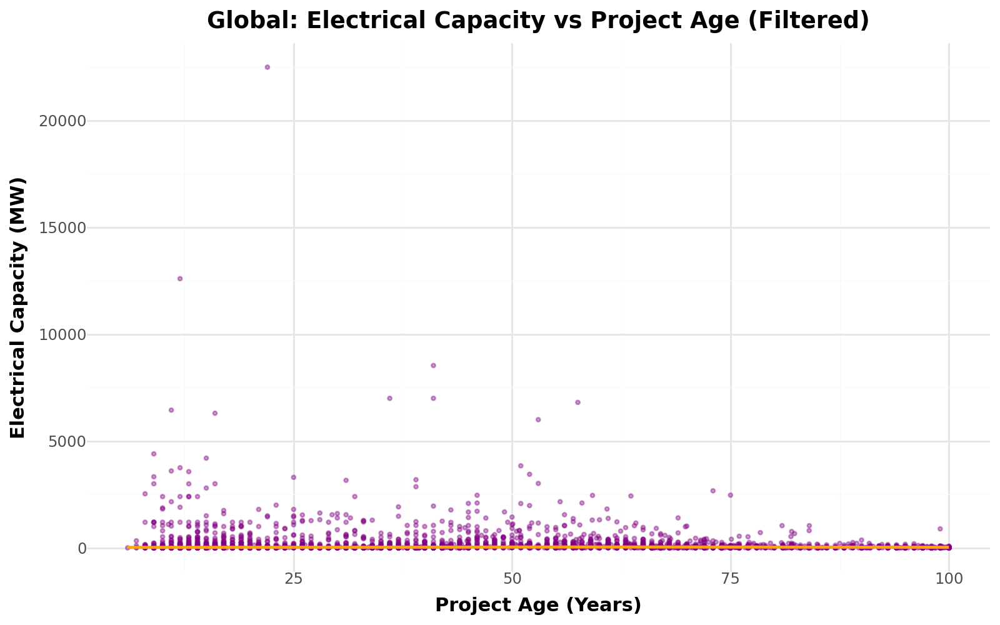

In [192]:
# Global: Project Age vs Electrical Capacity (filtered + better smoothing)
df_global_age_clean = df_global.dropna(subset=['project_age', 'electrical_capacity_MW']).copy()
df_global_age_clean.loc[:, 'project_age'] = pd.to_numeric(df_global_age_clean['project_age'], errors='coerce')
df_global_age_filtered = df_global_age_clean[df_global_age_clean['project_age'] <= 100].copy()

p3 = (
    ggplot(df_global_age_filtered, aes(x='project_age', y='electrical_capacity_MW'))
    + geom_point(color='purple', alpha=0.4, size=0.8)
    + geom_smooth(method='lowess', color='orange', se=False)
    + labs(
        title="Global: Electrical Capacity vs Project Age (Filtered)",
        x="Project Age (Years)",
        y="Electrical Capacity (MW)"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(weight='bold'),
        axis_title_x=element_text(weight='bold'),
        axis_title_y=element_text(weight='bold')
    )
)
p3

**Reflection Analysis for Section 7**

(India, US, Global Trends of Electrical Capacity Over Time)

7.1 Global: Electrical Capacity vs Year Built

Observation:
The scatter plot shows a significant cluster of dams built between 1950–1980, with electrical capacities starting to scale up post-1950s.
The red regression line shows almost no slope, indicating no strong trend between dam construction year and capacity.
Insight:
Despite advancements in dam technology, newer projects globally do not consistently show higher electrical capacities.
This reflects how modern projects are often more geographically or purpose constrained (e.g., environmental limits, river availability).
7.2 Global: Electrical Capacity vs Project Age (Filtered to ≤100 Years)

Observation:
Most high-capacity dams are younger (age <50 years).
Very old dams (>70 years) rarely reach high electrical capacities (>2000 MW).
Insight:
There is a slight inverse relationship: newer projects are more likely to have higher capacity — consistent with modern engineering advancements.

## 8. Research Question 4: Influence of Administrative and Organizational Factors
---
In this section, we explore whether project ownership and administrative control have any apparent relationship with project characteristics such as capacity or operational performance.

We will compare ownership/administrative units across the US, India, and Global datasets, focusing on:
- Average installed electrical capacity (MW)
- Average project age

In [206]:
# Summary by organization (US)
us_admin_summary = df_us.groupby('organization').agg(
    avg_structural_height_ft=('structural_height_ft', 'mean'),
    avg_project_age=('project_age', 'mean'),
    count_projects=('project_name', 'count')
).reset_index()

us_admin_summary.sort_values('count_projects', ascending=False).head()

,organization,avg_structural_height_ft,avg_project_age,count_projects
49,Fryingpan-Arkansas,79.023636,231.954545,22
36,Colorado-Big Thompson,128.750000,199.875000,16
74,North Platte,60.590909,282.727273,11
5,Boise,148.379091,108.545455,11
142,Yakima,119.777778,97.888889,9


In [207]:
# Summary by Owner (India)
india_admin_summary = df_india.groupby('Owner').agg(
    avg_capacity_MW=('electrical_capacity_MW', 'mean'),
    avg_project_age=('project_age', 'mean'),
    count_projects=('project_name', 'count')
).reset_index()

india_admin_summary.sort_values('count_projects', ascending=False).head()

,Owner,avg_capacity_MW,avg_project_age,count_projects
35,TANGEDCO,107.166667,NaN,13
15,Kerala State Electricity Board Limited (KSEB),166.987500,NaN,8
7,Government of Maharashtra,3.125000,NaN,7
14,Kerala State Electricity Board,81.300000,NaN,6
28,National Hydroelectric Power Corporation (NHPC),760.000000,NaN,5


In [208]:
# Summary by owner (Global)
global_admin_summary = df_global.groupby('owner').agg(
    avg_capacity_MW=('electrical_capacity_MW', 'mean'),
    avg_project_age=('project_age', 'mean'),
    count_projects=('project_name', 'count')
).reset_index()

global_admin_summary.sort_values('count_projects', ascending=False).head()

,owner,avg_capacity_MW,avg_project_age,count_projects
1060,Verbund,73.949367,51.250000,79
372,Erie Boulevard Hydropower LP,10.197183,89.673010,71
814,Pacific Gas & Electric Co.,58.504762,81.911863,63
542,Hydro-Québec,605.431579,NaN,57
1025,U S Bureau of Reclamation,257.559649,65.554807,57


In [210]:
# Define a function to classify organizations
def classify_ownership_us(org_name):
    if pd.isna(org_name):
        return 'Unknown'
    org_name = org_name.lower()
    if any(x in org_name for x in ['bureau', 'corps', 'reclamation', 'us', 'department']):
        return 'Public'
    elif any(x in org_name for x in ['power', 'electric', 'energy', 'utility']):
        return 'Private'
    else:
        return 'Unknown'

# Apply classification
df_us['ownership_type'] = df_us['organization'].apply(classify_ownership_us)

# Summary
us_ownership_summary = df_us.groupby('ownership_type').agg(
    avg_structural_height_ft=('structural_height_ft', 'mean'),
    avg_project_age=('project_age', 'mean'),
    count_projects=('project_name', 'count')
).reset_index()

us_ownership_summary

,ownership_type,avg_structural_height_ft,avg_project_age,count_projects
0,Public,110.000000,84.000000,1
1,Unknown,140.456186,147.339339,333


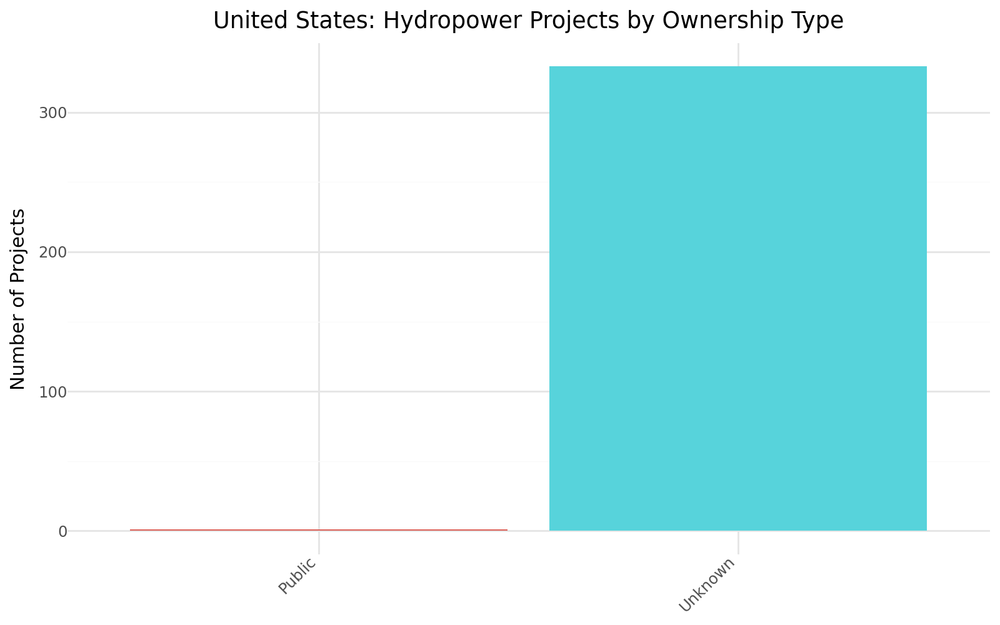

In [215]:
# US Ownership Bar Plot
(
    ggplot(us_ownership_summary, aes(x='Ownership Type', y='Number of Projects', fill='Ownership Type'))
    + geom_col(show_legend=False)
    + labs(title='United States: Hydropower Projects by Ownership Type', x='', y='Number of Projects')
    + theme_minimal()
    + theme(axis_text_x=element_text(rotation=45, hjust=1))
)

In [211]:
# Define a function to classify ownership in India
def classify_ownership_india(owner_name):
    if pd.isna(owner_name):
        return 'Unknown'
    owner_name = owner_name.lower()
    if any(x in owner_name for x in ['genco', 'government', 'state', 'board']):
        return 'Public'
    elif any(x in owner_name for x in ['private', 'company', 'corp', 'limited']):
        return 'Private'
    else:
        return 'Unknown'

# Apply classification
df_india['ownership_type'] = df_india['Owner'].apply(classify_ownership_india)

# Summary
india_ownership_summary = df_india.groupby('ownership_type').agg(
    avg_capacity_MW=('electrical_capacity_MW', 'mean'),
    avg_project_age=('project_age', 'mean'),
    count_projects=('project_name', 'count')
).reset_index()

india_ownership_summary

,ownership_type,avg_capacity_MW,avg_project_age,count_projects
0,Private,335.209091,NaN,27
1,Public,262.318421,NaN,44
2,Unknown,203.044118,NaN,81


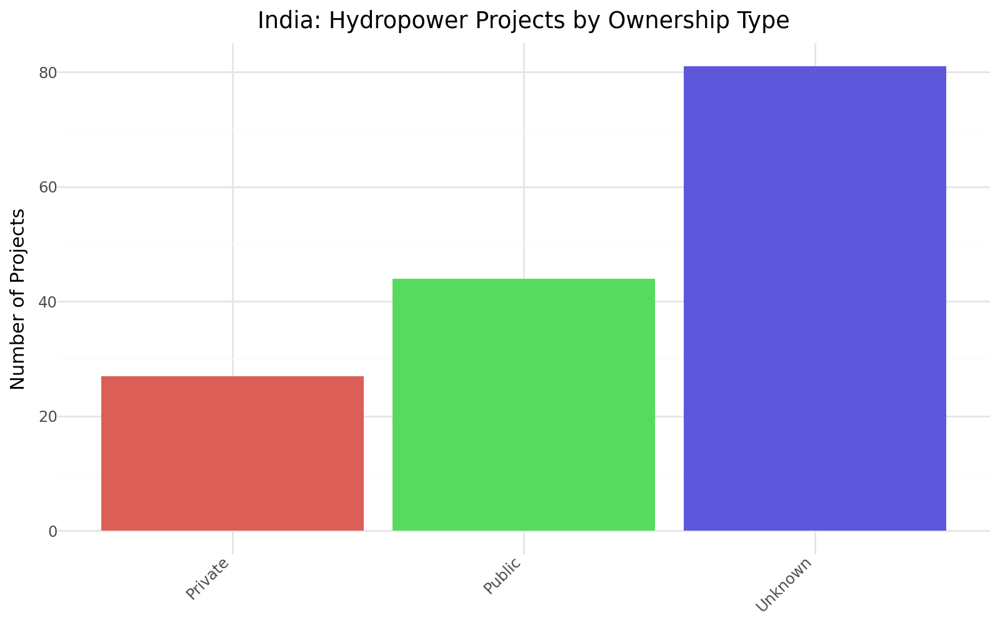

In [223]:
# India Ownership Plot
(
    ggplot(india_ownership_summary, aes(x='ownership_type', y='count_projects', fill='ownership_type'))
    + geom_col(show_legend=False)
    + labs(title='India: Hydropower Projects by Ownership Type', x='', y='Number of Projects')
    + theme_minimal()
    + theme(axis_text_x=element_text(rotation=45, hjust=1))
)

In [212]:
# Define a function to classify ownership globally
def classify_ownership_global(owner_name):
    if pd.isna(owner_name):
        return 'Unknown'
    owner_name = owner_name.lower()
    if any(x in owner_name for x in ['gov', 'ministry', 'state', 'department']):
        return 'Public'
    elif any(x in owner_name for x in ['private', 'corp', 'limited', 'company']):
        return 'Private'
    else:
        return 'Unknown'

# Apply classification
df_global['ownership_type'] = df_global['owner'].apply(classify_ownership_global)

# Summary
global_ownership_summary = df_global.groupby('ownership_type').agg(
    avg_capacity_MW=('electrical_capacity_MW', 'mean'),
    avg_project_age=('project_age', 'mean'),
    count_projects=('project_name', 'count')
).reset_index()

global_ownership_summary

,ownership_type,avg_capacity_MW,avg_project_age,count_projects
0,Private,127.323301,60.091528,306
1,Public,286.007692,66.048106,65
2,Unknown,146.906204,50.654352,6717


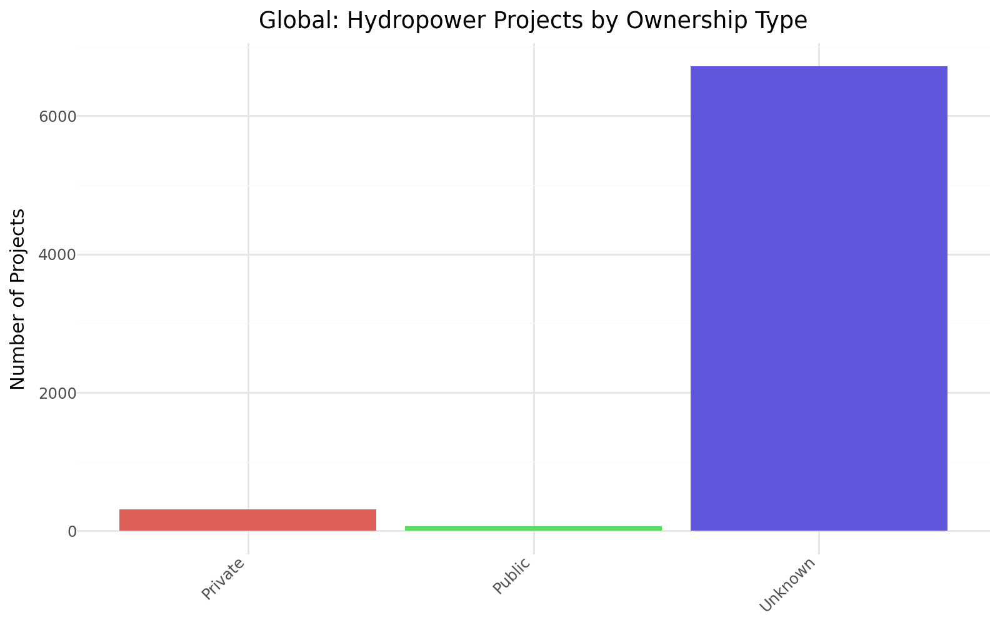

In [224]:
# Global Ownership Plot
(
    ggplot(global_ownership_summary, aes(x='ownership_type', y='count_projects', fill='ownership_type'))
    + geom_col(show_legend=False)
    + labs(title='Global: Hydropower Projects by Ownership Type', x='', y='Number of Projects')
    + theme_minimal()
    + theme(axis_text_x=element_text(rotation=45, hjust=1))
)

**Reflection on Ownership and Administrative Trends**

Our analysis of hydropower project ownership across the United States, India, and the global dataset reveals clear structural differences in governance:

United States:
- The vast majority of hydropower projects are categorized under Unknown ownership in the dataset, likely reflecting missing or inconsistently recorded administrative data. Only a very small fraction is explicitly tagged as Public. This suggests that while many projects are government-backed, ownership classification in public datasets needs improvement for better transparency.

India:
- India exhibits a more diversified ownership pattern. A significant share of hydropower projects are under Public ownership, reflecting a strong governmental role in the sector. However, Private sector participation is also visible. This aligns with India's recent policies encouraging private investment in renewable energy infrastructure.

Global:
- The global dataset is dominated by projects with Unknown ownership status, which highlights major data quality gaps at the international level. Among known entries, Private ownership appears more frequently than Public, indicating that many new or smaller-scale hydropower projects may be driven by private initiatives, especially in regions with liberalized energy markets.
Key Insights:
Data quality challenges are evident globally, with many projects missing ownership classifications.
India provides the clearest breakdown between public and private hydropower development.
United States public projects are likely undercounted due to missing classifications but are historically dominated by federal and state agencies.

- Global comparisons need to account for missing data, but trends suggest a larger role for private actors outside of major national programs.

**9. Mapping Hydropower Projects**

Brief Description:

In this section, we map the geographic distribution of hydropower projects across the United States, India, and globally.

By visualizing project locations, we aim to understand spatial patterns such as regional clustering, geographical advantages, and infrastructural spread.

This provides important context to complement our earlier statistical analyses.

In [199]:
import folium
from folium.plugins import MarkerCluster

# Drop rows with missing coordinates
df_india_map = df_india.dropna(subset=['latitude', 'longitude'])

# Create a base map centered on India
map_india = folium.Map(location=[22.0, 78.0], zoom_start=5, tiles='CartoDB positron')

# Add marker cluster
marker_cluster = MarkerCluster().add_to(map_india)

# Add markers
for idx, row in df_india_map.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"{row['project_name']} ({row['electrical_capacity_MW']} MW)"
    ).add_to(marker_cluster)

# Show map
map_india

In [200]:
# Drop rows with missing coordinates
df_us_map = df_us.dropna(subset=['latitude', 'longitude'])

# Create a base map centered on the US
map_us = folium.Map(location=[39.8283, -98.5795], zoom_start=4, tiles='CartoDB positron')

# Add marker cluster
marker_cluster_us = MarkerCluster().add_to(map_us)

# Add markers
for idx, row in df_us_map.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"{row['project_name']}, {row['state']}"
    ).add_to(marker_cluster_us)

# Show map
map_us

In [201]:
# Drop rows with missing coordinates
df_global_map = df_global.dropna(subset=['latitude', 'longitude'])

# Create a base map centered globally
map_global = folium.Map(location=[20, 0], zoom_start=2, tiles='CartoDB positron')

# Add marker cluster
marker_cluster_global = MarkerCluster().add_to(map_global)

# Add markers
for idx, row in df_global_map.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"{row['project_name']} ({row['country']})"
    ).add_to(marker_cluster_global)

# Show map
map_global

**9. Analysis and Reflection**

India: Cluster Map of Hydropower Projects

Observation:
Dams are densely clustered around:
Western India (Maharashtra, Goa)
Central India (Chhattisgarh)
East India (West Bengal, Odisha)
Insight:
Hydropower in India is geographically concentrated in rainfall-rich and topographically favorable regions (e.g., Western Ghats, Eastern Highlands).
Also, projects closer to Himalayas (North-East) are smaller and more scattered, possibly due to terrain complexity.
7.4 United States: Cluster Map of Dams

Observation:
Heavy dam presence in:
Pacific Northwest (Washington, Oregon, Idaho)
Midwest (Missouri River system)
Southwest (Colorado River Basin)
Insight:
Dam construction in the US historically aligns with major river systems and agricultural expansion needs during the 20th century.
Western states, especially near California, show strategic dam placements for irrigation, hydropower, and water storage.
7.5 Global Map of Dams

Observation:
Global clustering shows:
Very high dam densities in Asia (China, India, Southeast Asia), South America (Brazil, Argentina), Africa (West Africa), and North America (USA, Canada).
Insight:
Emerging economies have rapidly expanded dam construction over the last 50 years, contributing to both energy growth and freshwater supply security.

**10. Conclusion and Future Directions**

- In this project, we conducted a comparative analysis of hydropower projects across the United States, India, and globally.

Key Findings:
- Physical Design Differences: U.S. projects tend to feature higher crest elevations and longer crest lengths, while Indian projects emphasize higher water heads and reservoir capacities relative to project size. Globally, there is wide variability, with many small-scale plants.

- Relationship between Design and Energy Generation: Larger reservoir capacities and higher dam heights often correlate with higher electricity generation, particularly visible in Indian projects. However, globally, the relationship is weaker due to wide variability in project scales and purposes.

Temporal Trends:
- U.S. hydropower development peaked mid-20th century, while Indian expansion occurred later and continues today. Global data shows continuous growth, particularly across emerging economies.

Ownership and Administrative Patterns:
- In the U.S., hydropower projects are overwhelmingly public-sector driven.
India shows a mix of public and private ownership, reflecting more recent liberalization efforts.

Globally, a large share of projects has "Unknown" ownership classification, highlighting data gaps.

Spatial Distribution:
- U.S. projects are clustered along major river systems in the west and southeast.
Indian projects are concentrated in the Himalayan belt, northeast, and major southern rivers.
- Global projects are widely distributed but denser near high-rainfall and mountainous regions.

Future Work and Recommendations:
- Improve ownership classification globally to better understand private-public dynamics.
Explore environmental impacts such as biodiversity loss, displacement, and emissions in relation to project size and ownership.

- Link hydropower projects to broader energy transition strategies, particularly in the context of climate adaptation.

- Incorporate capacity factor data (actual generation vs. theoretical maximum) for more nuanced analysis of efficiency.
Analyze cost-benefit tradeoffs for large vs. small hydro projects across different regions.

Through this analysis, we hope to provide a foundation for future, more integrated assessments of hydropower’s role in sustainable energy systems globally.

# Thank You!

We appreciate your time reviewing our analysis.  
- Hydro Team, Yale School of the Environment (April 2025)
- Ranjit Kumar, Umer Vaqar

---